In [2]:
# import ps1_functions as ps1 
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import scipy
from scipy import linalg
from tqdm import tqdm
import codecs, json

# intro

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


- exploratory analysis
    
    - which variables are important?
    
    - do data has clusters? which variables best describe clusters?
    
    - how to visualize data to better understand it? phenomenon/experiment?
    

- How to deal with high-dimensional data? dimensionality reduction

    - methods: PCA, t-SNE, diffusion maps
    
        - keep different properties of data
        
        - different math motivations
    
    - validation of methods
    
        - step 1: artificial data (we understand geometrically/statistically)
        
        - step 2: real dataset (we understand biologically)

# understand dataset

In [3]:
def load_json_files(file_path):
    '''
    Loads data from a json file

    Inputs:
        file_path   the path of the .json file that you want to read in

    Outputs:
        json_data    this is a numpy array if data is numeric, it's a list if it's a string

    '''

    #  load data from json file
    with codecs.open(file_path, 'r', encoding='utf-8') as handle:
        json_data = json.loads(handle.read())

    # if a string, then returns list of strings
    if not isinstance(json_data[0], str):
        # otherwise, it's assumed to be numeric and returns numpy array
        json_data = np.array(json_data)

    return json_data


- Swiss Roll Dataset has 2000 samples and 3 features


- data: `swiss_roll_points.json`


- label range $[0, 1]$: `swiss_roll_labels.json` 

In [4]:
# read two JSON files 
leadstring = '/Users/wenxinxu/Desktop/CPSC553/data/swissroll/'
swiss_features = load_json_files(leadstring+'swiss_roll_points.json')
swiss_labels = load_json_files(leadstring+'swiss_roll_labels.json')

In [5]:
# check shape of features and labels: (2000, 3), (2000,)
print("Features shape: ", swiss_features.shape, "Labels shape: ", swiss_labels.shape)

# check range of labels
print("Range of labels: [", min(swiss_labels), ",", max(swiss_labels), "]")

Features shape:  (2000, 3) Labels shape:  (2000,)
Range of labels: [ 0.000276440241967576 , 1.0 ]


In [6]:
# pre-process data by centering features and labels to 0 mean
swiss_features -= np.mean(swiss_features, axis=0)

swiss_labels -= np.mean(swiss_labels, axis=0)

# after centering, check mean of features and labels
print("After centering")

print("Mean of features:", np.mean(swiss_features, axis=0))

print("Mean of labels:", np.mean(swiss_labels, axis=0))

After centering
Mean of features: [3.08086889e-17 4.72955008e-16 1.24993349e-14]
Mean of labels: -3.019806626980426e-17


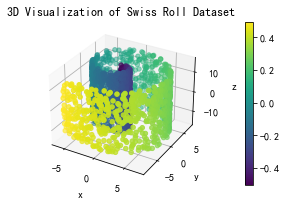

In [27]:
# visualize data using a scatter plot colored by label
# features are x, y, z coordinates
fig = plt.figure(figsize=(15, 3))
axes = fig.add_subplot(111, projection='3d')
x, y, z = swiss_features[:,0], swiss_features[:,1], swiss_features[:,2]
scatter = axes.scatter(x, y, z, c=swiss_labels)
axes.set(xlabel='x', ylabel='y', zlabel='z', title="3D Visualization of Swiss Roll Dataset")
fig.colorbar(scatter, ax=axes, location='right', anchor=(1.5, 0.3), shrink=1)

## Q 2.1 

- What does this visualization of the swiss roll data set look like? 
    
    It looks like a Swiss Roll.


- What properties do you notice about the data set?

    The data set has a geometrically curly shape.


- Are the provided labels meaningful, and if so, in what way? 

    Yes, There is a color gradient from the inside of Swiss Roll to the outside of Swiss Roll


- How do you expect a “good” dimensionality reduction technique to look for the swiss roll data set?

    It could unfold the roll to a surface. It maybe a nonlinear method.

## visualize data with PCA

1. Run PCA on data, obtaining principal components, projections, singular values

In [29]:
# SVD of data
u, s, vt = np.linalg.svd(swiss_features.T, full_matrices=False)

# v are principal components  shape (2000, 3)
v = vt.T
print("Principal components:\nshape:", v.shape, "\nvalue:\n", v)

print("\n") 

# projections   shape (3, 3)
projections = u @ np.diag(s) 
print("Projections:\nshape:", projections.shape, "\nvalue:\n", projections)

print("\n") 

# s are 3 singular values
print("Singular values:\nnumber", len(s), "\nvalues:\n", s) 

Principal components:
shape: (2000, 3) 
value:
 [[ 0.0103329  -0.0156763  -0.03898346]
 [-0.02676505  0.002989   -0.04337744]
 [ 0.03895009 -0.01599888 -0.03738325]
 ...
 [-0.02587455  0.00471208  0.00352396]
 [ 0.00338248  0.03723231  0.00207697]
 [ 0.03458155  0.00717131 -0.00252673]]


Projections:
shape: (3, 3) 
value:
 [[   5.2167858    -8.82683981 -165.36563411]
 [  -7.84488874  193.80358133   -7.57464212]
 [ 388.49038021    4.03205676    2.06763129]]


Singular values:
number 3 
values:
 [388.60459679 194.04638291 165.55193519]


2. Plot data in 2 dimensions using principal components, colored by labels

    You may try different combinations: 1st and 2nd, 1st and 3rd, 2nd and 3rd

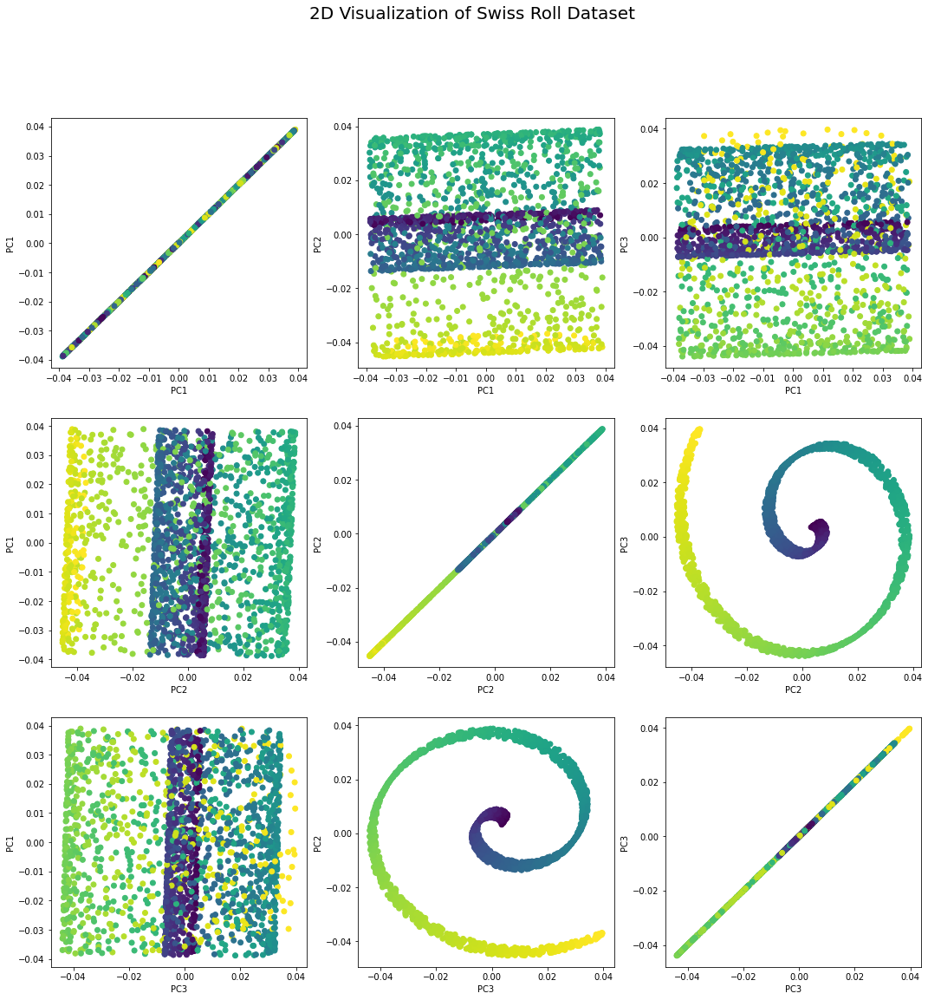

In [ ]:
fig, axes = plt.subplots(3,3,  figsize=(18,18))

plt.suptitle("2D Visualization of Swiss Roll Dataset", size=20)

for i in range(3):
    for j in range(3):
        axes[i,j].scatter(
                   x=v[:,i],
                   y=v[:,j],  
                   c=swiss_labels)
        axes[i,j].set_xlabel(f'PC{i+1}',size=10)
        axes[i,j].set_ylabel(f'PC{j+1}', size=10)  


# fig.savefig("swissroll_2D.png")

3. Plot singular values, choices are:

    - singular values
    
    - cumulative sum of singular values
    
    - explained variance 
    
    $$
    \frac{S^2}{n-1}
    $$
    
    where $S$ are singular values and $n$ is sample size

Text(0, 0.5, 'Explained Variance')

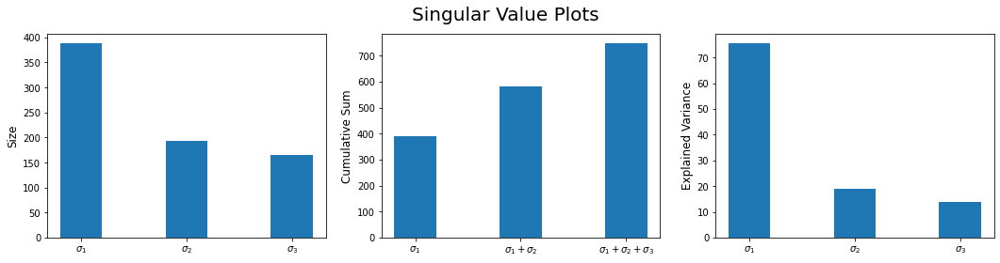

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(18,4))

plt.suptitle("Singular Value Plots", size=20)

label1 = list(["$\sigma_1$","$\sigma_2$","$\sigma_3$"])
axes[0].bar(label1, s,  width = 0.4)
axes[0].set_ylabel('Size', size=12)

label2 = (["$\sigma_1$","$\sigma_1+\sigma_2$","$\sigma_1+\sigma_2+\sigma_3$"])
axes[1].bar(label2, np.cumsum(s), width = 0.4)
axes[1].set_ylabel("Cumulative Sum", size=12)

axes[2].bar(label1, (s**2)/(swiss_features.shape[0]-1), width = 0.4)
axes[2].set_ylabel('Explained Variance', size=12)

# fig.savefig("swissroll_PCA_singularvalues.png")

## Q 2.2

- As a dimensionality reduction technique, to what extent does PCA retain properties of swiss roll dataset?

    PCA performs a bad job of unfolding the swiss roll, i.e. explaining the color gradient. A plot of PC1 VS. PC2 or a plot of PC1 VS. PC3 tried to unfold the swiss roll but the color bands overlapped. While a plot of PC2 VS. PC3 failed to unfold the swiss roll.


- Can you explain why the visualizations look like this, given how the algorithm works?

    Because PCA is a linear transformation. A plot of PC1 VS. PC2 is a projection of swiss roll in $\mathbb{R}^3$ onto yz-plane. A plot of PC1 VS. PC3 is a projection of swiss roll in $\mathbb{R}^3$ onto xz-plane. A plot of PC2 VS. PC3 is a projection of swiss roll in $\mathbb{R}^3$ onto xy-plane. So there are many overlapped colored points in the first two plots. While the third plot is a cross section removing the z-dimension.


- What can you learn about the intrinsic dimensionality from the singular values?

    By looking at the 3 plots of singular values, we can see the first singular value explained the most variance of data, in that way the properties (meaningful part) of data is only located in one dimension, it makes sense because after we unfold the swiss roll to a rectangular band, we could project the band onto xy-plane, then the projected band is a line of color gradient, which is in 1D.

# implement diffusion maps

## algo review

- NeurIPS paper "Diffusion Maps, Spectral Cluster, Eigenvectors OF Rokker-Planck Operators"

- function: diffusion mapping $\Psi_t: \mathbb{R}^{n \times p} \rightarrow \mathbb{R}^{n \times (n-1)}$


- input: 

    - dataset $X = \left \{ x_1,...,x_n \right \} \in \mathbb{R}^{n \times p}$, where $n$ is sample size, $p$ is number of features
    
    - kernel function $\kappa (;): \mathbb{R}^p \times \mathbb{R}^p \rightarrow \mathbb{R}$
    
    - diffusion param $t \in \mathbb{R}$
    
    
- output: 

    - diffusion maps $\Psi_t(X)\in \mathbb{R}^{n \times (n-1)}$    

- Note: to compute eigenpairs $(\lambda_i, \varphi_i)$ of $M^T$, 

    we first compute eigenpairs $(\tilde{\lambda_i},v_i)$ of **symmetric matrix** $M_s$,
    
    then do transformation to get eigenpairs $(\lambda_i, \varphi_i)$ of $M^T$, 

    coz $M_s$ is a real symmetric matrix, this method is more efficient and numerically stable

Steps:

1. create a kernel matrix (affinity matrix) $W \in \mathbb{R}^{n \times n}$

$$
W_{i,j}=\kappa (x_i,x_j)=\exp \left ( -\frac{\left \| x_i -x_j \right \|^2}{\sigma^2} \right )
$$

where $\kappa: \mathbb{R}^k \times \mathbb{R}^k \rightarrow \mathbb{R}$ is kernel function, 

$\sigma \in \mathbb{R}$ is bandwidth,

$W_{i,j} \in \mathbb{R}$ is the entry in the ith row and the jth column of kernel matrix $W$

  
2. create a symmetric matrix $M_s\in \mathbb{R}^{n \times n}$

    where $D\in \mathbb{R}^{n \times n}$ is a diagonal matrix of row sums of affinity matrix $W$

$$
M_s= D^{-1/2}WD^{-1/2} 
$$


3. compute all the $n$ right eigenpairs of $M_s$: 

$$(\tilde \lambda_1, v_1),..., (\tilde \lambda_n, v_n)$$
    
$$
1 =\tilde  \lambda_1 \geq \tilde \lambda_2 \geq ... \geq \tilde \lambda_n \geq 0
$$

i.e. eigendecomposition of $M_s$:

$$
M_s = V \Lambda V^{-1}
$$

where $V \in \mathbb{R}^{n \times n}$ is an orthogonal matrix, ith column is ith eigenvector $v_i \in \mathbb{R}^{n}$ of $M_s$,

$\Lambda \in \mathbb{R}^{n \times n}$ is a diagonal matrix, ith diagnoal entry $\tilde \lambda_i \in \mathbb{R}$ is ith eigenvalue of $M_s$,


4. compute all the $n$ **normalized** right eigenvectors $\varphi _i \in \mathbb{R}^{n}$ of Markov matrix $M$: 

$$
\varphi _i = \frac{D^{-1/2} v_i}{\left \|  D^{-1/2} v_i\right \|}
$$

eigenvalues of $M$ (or $M^t$) is same as $M_s$: 

$$\lambda_i=\tilde{\lambda_i}$$

$$1 = \lambda_1 \geq \lambda_2 \geq ... \geq \lambda_n \geq 0$$

where $M^t$ is powered Markov transition matrix (non-symmetric matrix), i.e., Markov matrix $M  \in \mathbb{R}^{n \times n}$ powered by diffusion parameter $t$

$$
M=D^{-1}W
$$

while right eigenvectors of $M$ (or $M^t$) is matrix $D^{-1/2} \in \mathbb{R}^{n \times n}$ left multiply eigenvectors of $M_s$:

$$
\varphi_i=D^{-1/2}v_i
$$

then we normalize $\varphi_i$ by its $l_2$ norm $\left \|  D^{-1/2} v_i\right \|$

if we express all $n$ eigenvectors of $M$ in a matrix $\Phi \in \mathbb{R}^{n \times n}$,

$$
\Phi = D^{-1/2} V
$$


5. compute diffusion maps of whole dataset $\Psi_t(X) \in \mathbb{R}^{n \times (n-1)}$

$$
\Psi_t(X)=\mathbf{\lambda ^t}\odot 
\begin{bmatrix}
 |&  & |\\ 
\varphi _2 & \cdots  & \varphi _n\\ 
| &  & |
\end{bmatrix}
=\begin{bmatrix}
 |&  & |\\ 
\lambda_2^t \varphi _2 & \cdots  & \lambda_n^t \varphi _n\\ 
| &  & |
\end{bmatrix}
$$

where $\mathbf{\lambda} \in \mathbb{R}^{n-1}$ contains all the $n-1$ nontrivial eigenvalues of Markov matrix $M$

$\mathbf{\lambda}^t \in \mathbb{R}^{n-1}$ is take power t of every entry in this vector 
    

6. return $\Psi_t(X)$

    where diffusion map for jth data point $\Psi_t(x_j) \in \mathbb{R}^{n-1}$ is jth row of matrix $\Psi_t(X)$

$$
\Psi_t(x_j)=
\begin{bmatrix}
\lambda_2 \varphi_2(j)\\ 
\lambda_3 \varphi_3(j)\\ 
\vdots \\ 
\lambda_n \varphi_n(j)\end{bmatrix}
$$

Note: here we discard the first eigenvector $\varphi_1$

reason (Lecture 9): we can prove that the first eigenvector $\varphi_1$ with eigenvalue 1 is a constant vector (all-ones vector) $\mathbf{1}$, so it's a **trivial eigenvector**, we discard it from diffusion map coz it don't reveal info about our data

## implement details

- array computations: `numpy` package, `numpy.linalg` sub-package

    `sum`, `std`, `exp`, `abs`, `zeros`, `dot`, `norm`, `power`, `svd`, `eigh`
    

- plotting: `matplotlib` package and `numpy` arrays


- skeleton file: `ps1_functions.py` 5 functions

    `load_json_files()`: loading JSON data into numpy arrays
    
    `compute_distances()`: creating Euclidean distance matrix from dataset
    
    `compute_affinity_matrix()`: creating an affinity matrix from a distance matrix via a Gaussian kernel
    
    `diff_map_info()`: creating info for easily create diffusion map at t
    
    `get_diff_map()`: creating a diffusion map at t from eigenvalues and eigenvectors of Markov Matrix

In [11]:
def compute_distances(X):
    '''
    Constructs a distance matrix from data set, assumes Euclidean distance

    Inputs:
        X: a numpy array of size n x p holding the data set (n observations, p features)

    Outputs:
        D: a numpy array of size n x n containing the euclidean distances between points

    '''
    n = X.shape[0]
    D = np.zeros([n, n])
    
    for i in range(n):
        for j in range(n):
            D[i,j] = np.linalg.norm(X[i] - X[j])

    # return distance matrix
    return D

In [12]:
def compute_affinity_matrix(D, kernel_type, sigma=None, k=None):
    '''
    Construct an affinity matrix from a distance matrix via gaussian kernel.

    Inputs:
        D               a numpy array of size n x n containing the distances between points
        kernel_type     a string, either "gaussian" or "adaptive".
                            If kernel_type = "gaussian", then sigma must be a positive number
                            If kernel_type = "adaptive", then k must be a positive integer
        sigma           the non-adaptive gaussian kernel parameter
        k               the adaptive kernel parameter

    Outputs:
        W       a numpy array of size n x n that is the affinity matrix

    '''
    if kernel_type == 'gaussian':
        if sigma > 0:
            W = np.exp(-(D/sigma)**2)
        else:
            raise ValueError("Kernel type is gaussian, sigma must be a positive number!")
    
    if kernel_type == 'adaptive':
        if k > 0 and type(k) == int:
            W = np.zeros(shape=D.shape)
            for i in tqdm(range(D.shape[0])):
                sigmak_xi = np.sort(D[i])[k]
                for j in range(D.shape[1]):
                    euclidean_dist = D[i,j]**2 
                    sigmak_xj = np.sort(D[j])[k]
                    W[i,j] = 0.5*(np.exp((-euclidean_dist)/(sigmak_xi**2))+np.exp((-euclidean_dist)/(sigmak_xj**2)))
        else:
            raise ValueError("Kernel type is adaptive, k must be a positive integer!")
        
    # return the affinity matrix
    return W

In [13]:
def diff_map_info(W):
    '''
    Construct the information necessary to easily construct diffusion map for any t

    Inputs:
        W           a numpy array of size n x n containing the affinities between points

    Outputs:

        diff_vec    a numpy array of size n x n-1 containing the n-1 nontrivial eigenvectors of Markov matrix as columns
        diff_eig    a numpy array of size n-1 containing the n-1 nontrivial eigenvalues of Markov matrix

        We assume the convention that the coordinates in the diffusion vectors are in descending order
        according to eigenvalues.
    '''
    # compute negative square root of diagonal matrix of row sums of affinity matrix
    neg_sqrt_D = np.diag(W.sum(axis=1)**(-0.5))
    
    # create symmetric matrix M_s
    M_s = neg_sqrt_D @ W @ neg_sqrt_D
    
    # compute eigenpairs of symmetric matrix M_s
    # Note eigenvalues are in ascending order
    tilde_eig, tilde_vec = np.linalg.eigh(M_s)
    
    # compute normalized eigenvectors of Markov matrix M
    diff_vec = (neg_sqrt_D @ tilde_vec) / np.linalg.norm(neg_sqrt_D @ tilde_vec, axis=0)
       
    # discard first eigenvalue and eigenvector and re-arrange them in descending order
    diff_vec = np.flip(diff_vec, axis=1)[:,1:]
    diff_eig = tilde_eig[::-1][1:]

    # return the info for diffusion maps
    return diff_vec, diff_eig

In [14]:
def get_diff_map(diff_vec, diff_eig, t):
    '''
    Construct a diffusion map at t from eigenvalues and eigenvectors of Markov matrix

    Inputs:
        diff_vec    a numpy array of size n x n-1 containing the n-1 nontrivial eigenvectors of Markov matrix as columns
        diff_eig    a numpy array of size n-1 containing the n-1 nontrivial eigenvalues of Markov matrix
        t           diffusion time parameter t

    Outputs:
        diff_map    a numpy array of size n x n-1, the diffusion map defined for t
    '''
    # first broadcasting diff_eig to size n x n-1, then do Hadamard Product
    diff_map = (diff_eig**t) * diff_vec 

    return diff_map

In [15]:
def diff_map(X, kernel_type, t, sigma=None, k=None):
    """
    Compute diffusion maps of data, return diffusion maps, nontrivial eigenvectors and eigenvalues of Markov matrix
    
    Inputs:
        X           a numpy array of size n x p holding the dataset (n observations, p features)
        kernel_type a string, eigher "gaussian" or "adaptive"
        sigma       non-adaptive gaussian kernel parameter
        k           adaptive kernel parameter
        t           diffusion time parameter t 

    Outputs:
        diff_map    a numpy array of size n x n-1, the diffusion map defined for t 
        diff_vec    a numpy array of size n x n-1 containing the n-1 nontrivial eigenvectors of Markov matrix as columns
        diff_eig    a numpy array of size n-1 containing the n-1 nontrivial eigenvalues of Markov matrix
    """

    # compute distance matrix
    D = compute_distances(X)

    # compute affinity matrix
    W = compute_affinity_matrix(D, kernel_type, sigma, k)

    # compute eigenvectors and eigenvalues of Markov matrix
    diff_vec, diff_eig = diff_map_info(W)

    # compute diffusion maps
    diff_map = get_diff_map(diff_vec, diff_eig, t)

    return diff_map, diff_vec, diff_eig

# ex 1: swiss roll dataset

- 2D manifold: a set $X\subset \mathbb{R}^n$ is a 2D manifold 

    if at every point $x \in X$, a neighborhood around $x$ looks just like a section of $\mathbb{R}^2$
    
    geometrically, you can think about this as a 2D sheet in 3D space pr higher
    

- Swiss roll dataset is a synthetic dataset,     
    
    points are sampled from a 2D manifold,

    coz swiss roll has such structure,
    
    it's commonly used to test embedding algorithms,
    
    we can see what a good 2D embedding looks like

## visualize data with diffusion maps

- for each point $x$ in dataset, $\Psi_t(x)$ is an n-D vector, so we can only visualize 2D or 3 D slices

For $\sigma$ = 3.0, 1.0, 6.0

1. construct diffusion map of swiss roll dataset using Euclidean distance and Gaussian kernel with width $\sigma$ and diffusion param $t=1$

In [11]:
diff_maps = [0 for i in range(3)] 
diff_vecs = [0 for i in range(3)] 
diff_eigs = [0 for i in range(3)]  
sigmas = [3.0, 1.0, 6.0]

for i, sigma in enumerate(sigmas):  
    diff_maps[i], diff_vecs[i], diff_eigs[i] = diff_map(swiss_features, "gaussian", 1, sigma=sigma, k=None)

2. create 2D scatterplots of diffusion mapping using different coordinates

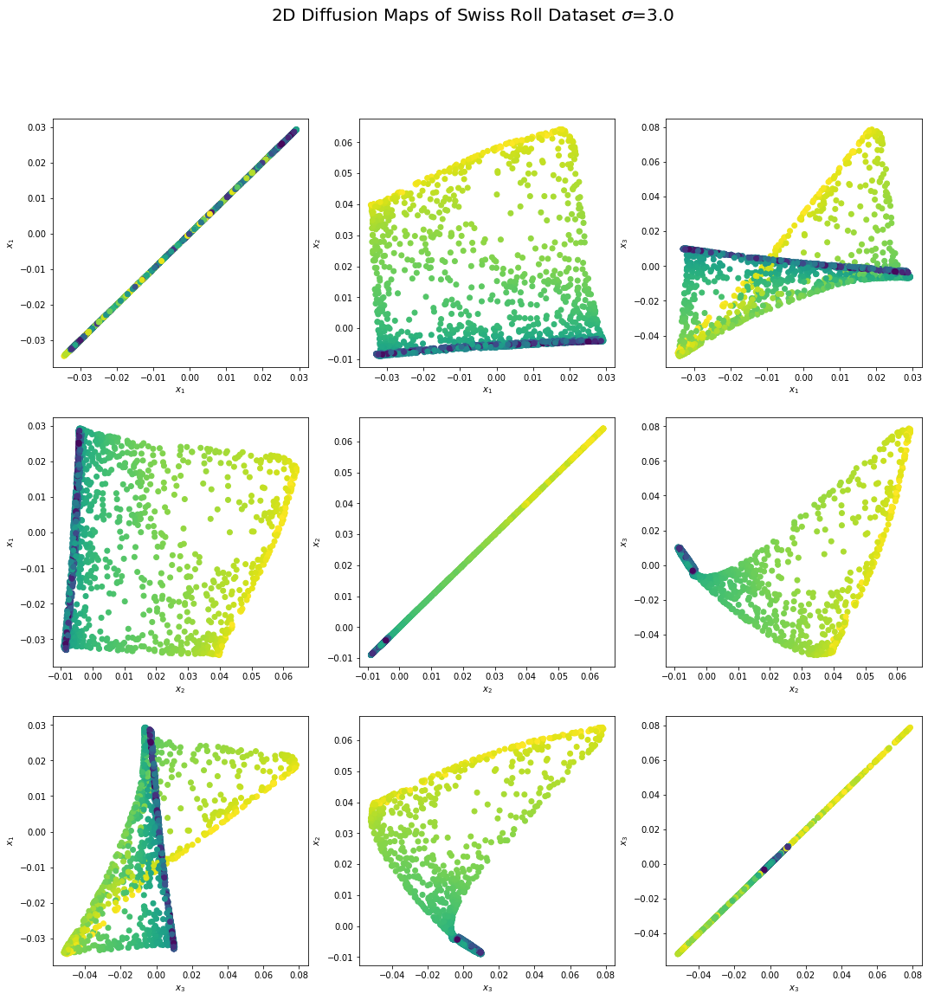

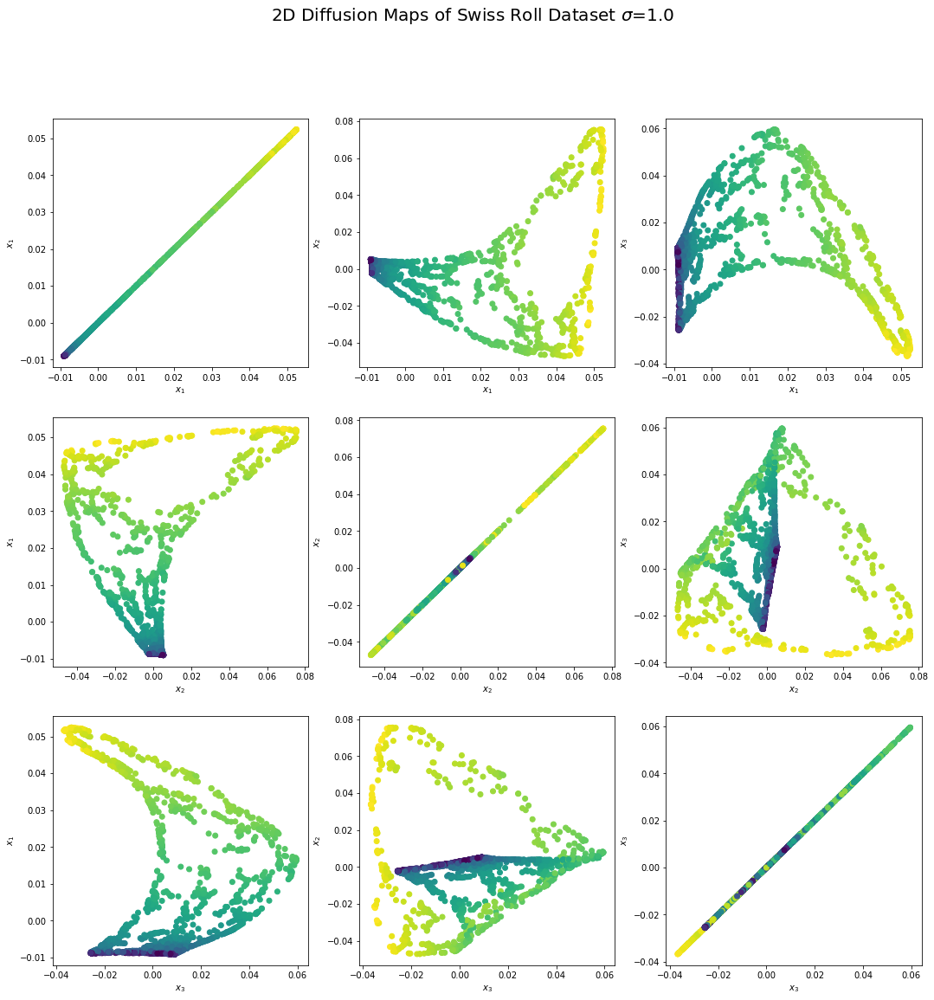

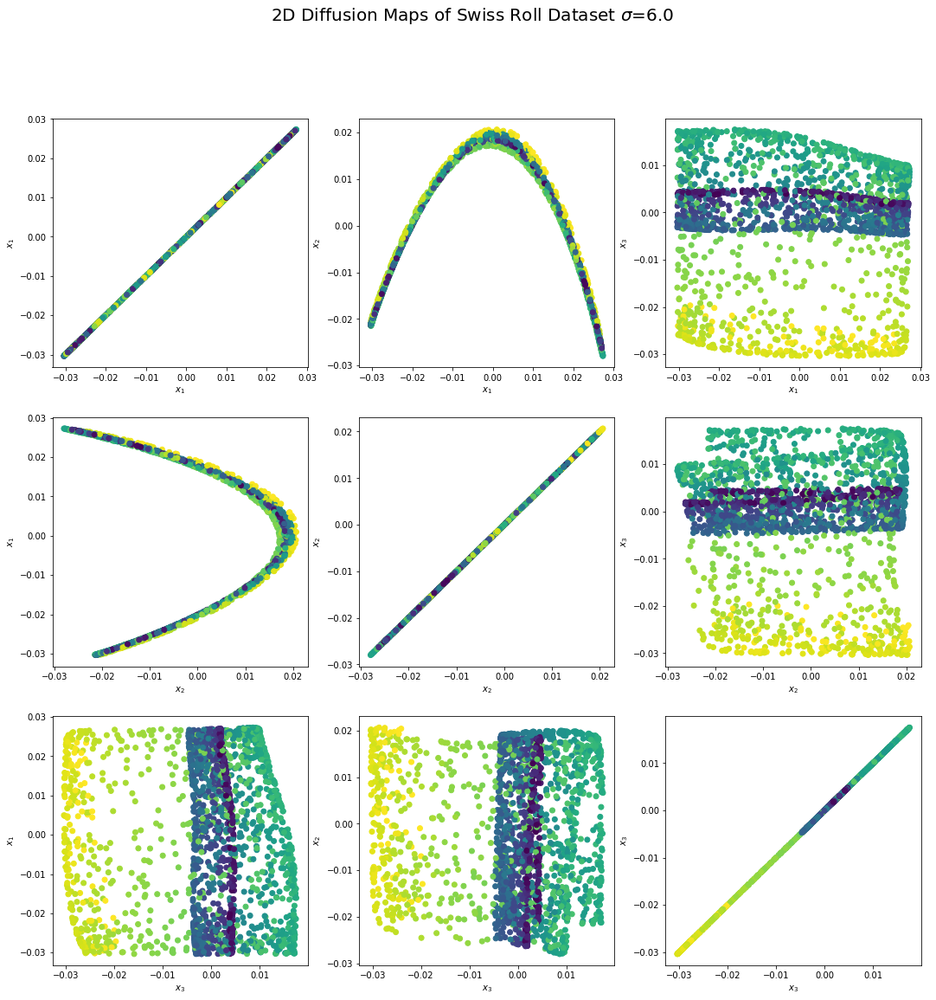

In [ ]:
for i, sigma in enumerate(sigmas): 
    fig, axes = plt.subplots(3,3,  figsize=(18,18))
    plt.suptitle(f"2D Diffusion Maps of Swiss Roll Dataset $\sigma$={sigma}", size=20)
    for j in range(3):
        for k in range(3):                        
            axes[j,k].scatter(x=diff_maps[i][:,j],y=diff_maps[i][:,k], c=swiss_labels)
            axes[j,k].set_xlabel(f'$x_{j+1}$',size=10)
            axes[j,k].set_ylabel(f'$x_{k+1}$', size=10) 
    
    # fig.savefig(f"swissroll_diffmap_sigma{sigma}.png")

3. plot eigenvalues $\lambda_i$ of Markov matrix $M$

Text(0.5, 1.0, 'Eigenvalues of Markov Matrix via Gaussian Kernel')

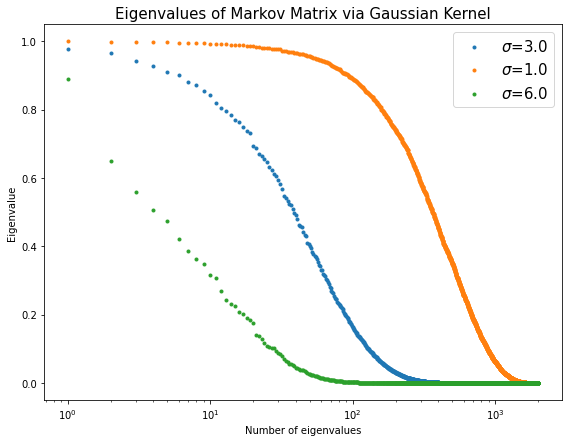

In [ ]:
fig, axes = plt.subplots(figsize=(8,6))

for i, sigma in enumerate(sigmas):
    axes.scatter(x=range(len(diff_eigs[i])+1)[1:], 
                y=diff_eigs[i],
                marker='.',
                label=f"$\sigma$={sigma}") 

axes.set_xlabel('Number of eigenvalues')

axes.set_ylabel('Eigenvalue')

plt.legend(loc='upper right', fontsize=15)

plt.semilogx() 

plt.tight_layout()

plt.title("Eigenvalues of Markov Matrix via Gaussian Kernel", size=15)

# fig.savefig("swissroll_diffmap_fixed_eigenvalues.png")

## Q 4.1

- As a dimensionality reduction technique, to what extent does diffusion mapping retain properties of swiss roll dataset?

    Diffusion mapping perform a better job than PCA to unfold the swiss roll because plot of $x_1$ VS $x_2$ almost made it. It retains the non-linear, manifold shape of swiss roll.


- Can you explain why visualizations look like this, given how algo works?

    By applying diffusion mapping, the points which are originally far apart become close while the points which are originally close become far apart. So the 2D visualizations unfold the swiss roll to different extent. plots of $x_1$ VS $x_2$ give a 1D manifold while plot of $x_1$ VS $x_3$ or plot of $x_2$ VS $x_3$ still give a 2D manifold. 
    

- What can you learn about intrinsic dimensionality of dataset from eigenvalues of $M$?

    From the plot of eigenvalues of $M$ given different $\sigma$, we can see there is a sharp decrease of eigenvalues when the number of eigenvalues approaches to 100.


- How does choice of Gaussian kernel width $\sigma$ change embedding and why?

    Between $\sigma=1.0, 3.0, 6.0$, $\sigma=3.0$ performed the best job of unfolding swiss roll. Because $\sigma$ controls distance between two points in diffusion maps. When $\sigma$ is too small or too large, both diffusion mapping can't capture neighbors of a point.

# understand first eigenvector of Markov Matrix

1. construct affinity matrix of swiss roll dataset using Euclidean distance and Gaussian kernel with width $\sigma=1.0$

In [16]:
# compute distance matrix
D = compute_distances(swiss_features)

# compute affinity matrix
W = compute_affinity_matrix(D, "gaussian", sigma=1.0, k=None)

In [17]:
W.shape # (2000, 2000)

(2000, 2000)

In [16]:
W

array([[1.00000000e+000, 6.48625588e-097, 1.81101234e-054, ...,
        5.19391203e-115, 9.70181706e-070, 1.20248473e-063],
       [6.48625588e-097, 1.00000000e+000, 2.83005554e-290, ...,
        5.20153433e-027, 4.20719732e-104, 1.07190655e-267],
       [1.81101234e-054, 2.83005554e-290, 1.00000000e+000, ...,
        2.92713538e-303, 1.44914199e-148, 3.21692731e-025],
       ...,
       [5.19391203e-115, 5.20153433e-027, 2.92713538e-303, ...,
        1.00000000e+000, 3.48589386e-074, 5.73425846e-241],
       [9.70181706e-070, 4.20719732e-104, 1.44914199e-148, ...,
        3.48589386e-074, 1.00000000e+000, 1.35382140e-079],
       [1.20248473e-063, 1.07190655e-267, 3.21692731e-025, ...,
        5.73425846e-241, 1.35382140e-079, 1.00000000e+000]])

2. compute largest left eigenvector $\phi_1$ of $M=D^{-1}W$, maybe obtained as $\phi_1=v_1 D^{1/2}$

In [17]:
# compute eigenvectors and eigenvalues of Markov matrix
diff_vec, diff_eig = diff_map_info(W)
phi1 = diff_vec[:,0] # shape: (2000,)
phi1

array([ 0.03508958,  0.02482031,  0.03590893, ..., -0.00898086,
        0.00565618, -0.00875206])

In [20]:
abs(phi1).sum()

32.779643083129756

3. plot swiss roll in 3D using original coordinates and color the points using corresponding values in $\phi_1$

Text(0.5, 0.92, 'Swiss Roll Dataset colored by First Eigenvector of Markov Matrix')

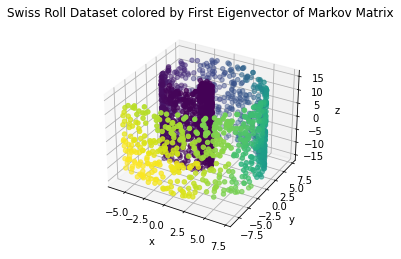

In [ ]:
# visualize data using a scatter plot colored by first eigenvector
# features are x, y, z coordinates

fig = plt.figure()

axes = fig.add_subplot(111, projection='3d')

x, y, z = swiss_features[:,0], swiss_features[:,1], swiss_features[:,2]

axes.scatter(x, y, z, c=phi1)

axes.set_xlabel("x") 

axes.set_ylabel("y") 

axes.set_zlabel("z") 

axes.set_title("Swiss Roll Dataset colored by First Eigenvector of Markov Matrix")

# fig.savefig("swissroll_3D_1st_eigenvector.png")

## Q 5.1 

- How do values in $\phi_1$ correspond to structure of swiss roll

    The gradient of values in $\phi_1$ is perfectly consistent with structure of swiss roll.
    

- Can you explain what you are seeing in terms of diffusion?

    The points are diffusing from the central axis of swiss roll like a swirl, as they spread farther and farther, the density of them also becomes smaller and smaller.

## use an Adaptive Gaussian Kernel

- Gaussian kernel width $\sigma$ was fixed for all data points.


- k-nearest neighbors kernel function $\kappa_{k-nn}: \mathbb{R}^p \times \mathbb{R}^p \rightarrow \mathbb{R}$

$$
\kappa_{k-nn}(x_i, x_j) = \frac{1}{2} \left [ \exp\left ( -\frac{\left \| x_i - x_j \right \|^2}{\sigma_k(x_i)^2} \right ) +\exp\left ( -\frac{\left \| x_i - x_j \right \|^2}{\sigma_k(x_j)^2} \right ) \right ]
$$

where $\sigma_k(x_i)$ is the Euclidean distance from ith data point $x_i$ to its $k$ th nearest neighbor

For a fixed $k$, $\sigma_{k-nn}=\left \{ \sigma_1,..., \sigma_n \right \}$ are choices of adaptively chosen bandwidth


1. create diffusion map $\Psi_t$ of swiss roll dataset using Euclidean distance, adaptive k-nearest neighbor Gaussian kernel with $k=5$ and diffusion param $t=1$


In [ ]:
adap_diff_maps = [0, 0] 

adap_diff_vecs = [0, 0] 

adap_diff_eigs = [0, 0]  

ks = [5, 10]

for i, k in enumerate(ks):
    
    adap_diff_maps[i], adap_diff_vecs[i], adap_diff_eigs[i] = diff_map(swiss_features, "adaptive", 1, sigma=None, k=k)


100%|██████████| 2000/2000 [08:35<00:00,  3.88it/s]


2. create 2D scatter plots of diffusion mapping using different coordinates

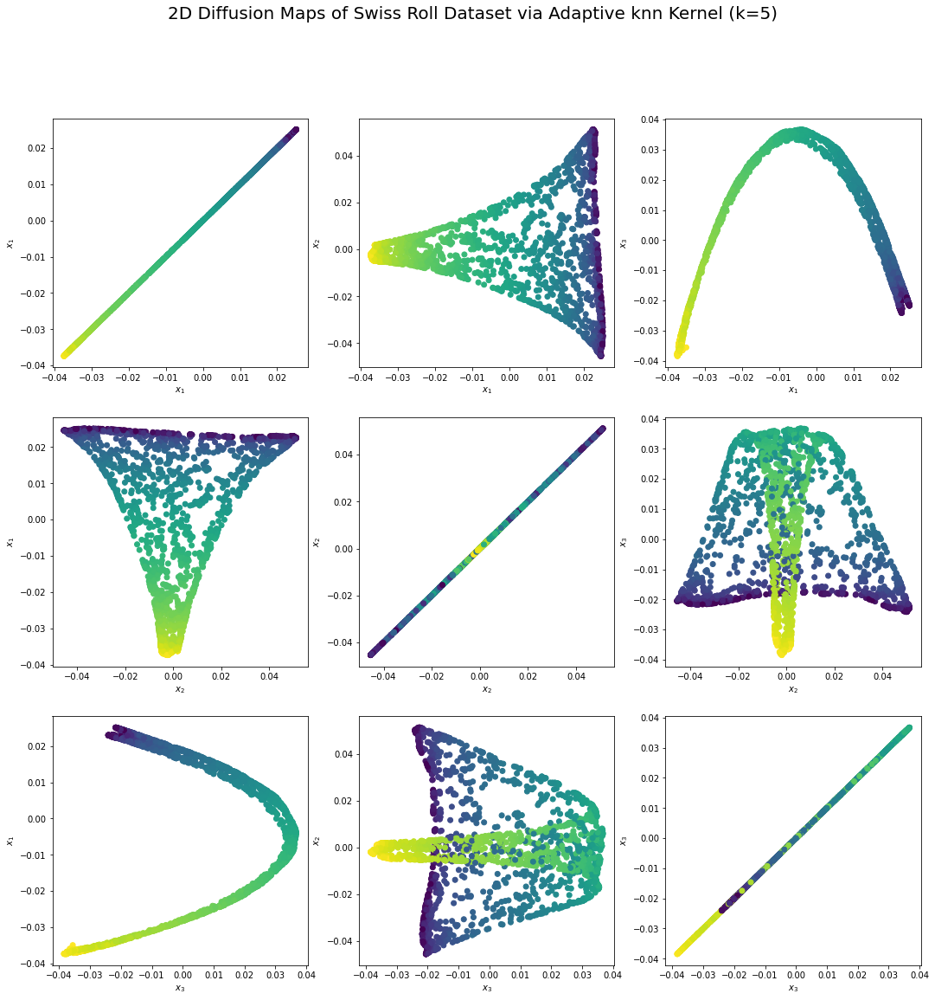

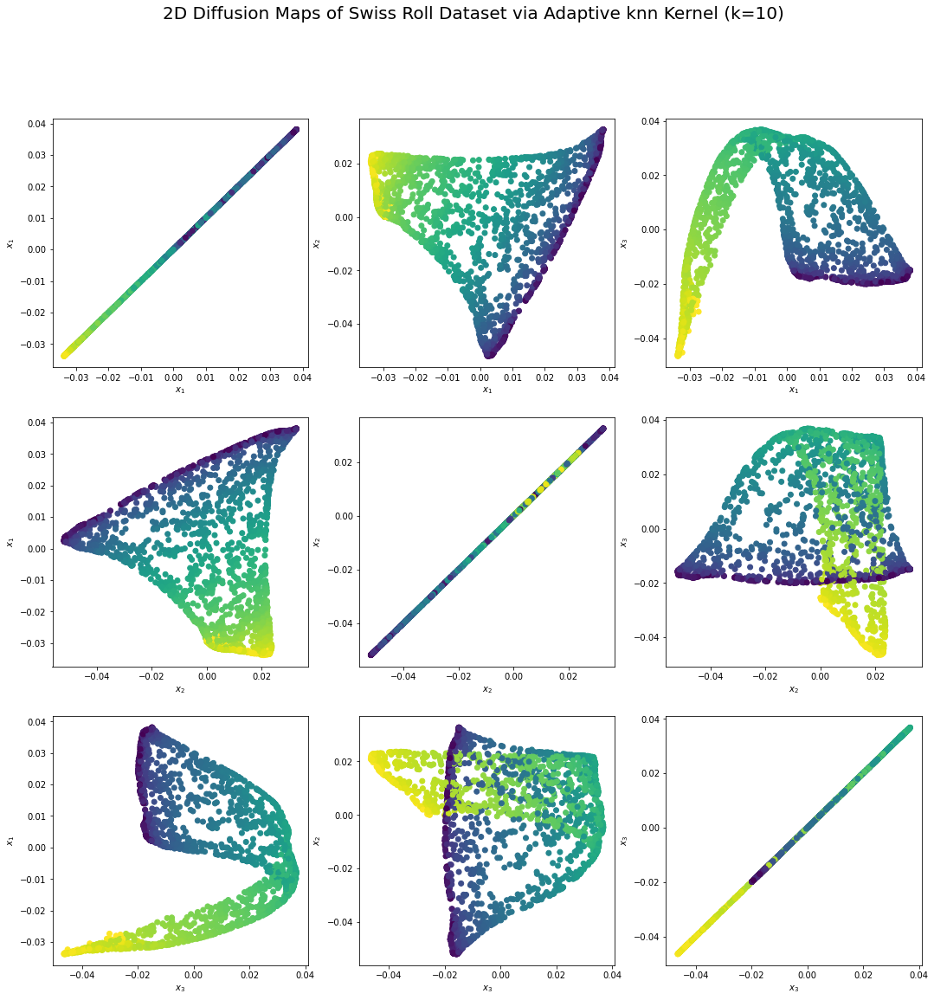

In [ ]:
for i,k in enumerate(ks):
    fig, axes = plt.subplots(3,3,  figsize=(18,18))
    plt.suptitle(f"2D Diffusion Maps of Swiss Roll Dataset via Adaptive knn Kernel (k={k})", size=20)

    for j in range(3):
        for q in range(3):  
                        
            axes[j,q].scatter(x=adap_diff_maps[i][:,j],
                              y=adap_diff_maps[i][:,q], 
                              c=swiss_labels)
            axes[j,q].set_xlabel(f'$x_{j+1}$',size=10)
            axes[j,q].set_ylabel(f'$x_{q+1}$', size=10) 
    # fig.savefig("swissroll_diffmap_adap_k{k}.png")

3. plot eigenvalues $\lambda_i$ of Markov Matrix $M$

Text(0.5, 1.0, 'Eigenvalues of Markov Matrix via Adaptive Kernel')

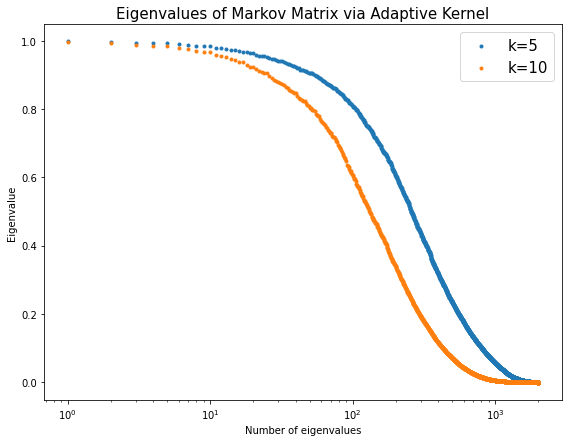

In [ ]:
fig, axes = plt.subplots(figsize=(8,6))
for i,k in enumerate(ks):
    axes.scatter(x=range(len(adap_diff_eigs[i])+1)[1:], 
                y=adap_diff_eigs[i],
                marker='.',
                label=f"k={k}") 

axes.set_xlabel('Number of eigenvalues')
axes.set_ylabel('Eigenvalue')
plt.legend(loc='upper right', fontsize=15)
plt.semilogx()
plt.tight_layout()
plt.title("Eigenvalues of Markov Matrix via Adaptive Kernel", size=15)
# fig.savefig("swissroll_diffmap_adap_eigenvalues.png")

4. Repeat for $k=10$

## Q 5.2

- What are differences between fixed and adaptive choices of kernel parameters $\sigma$?

    Differences are in density calculations.


- Explain the difference.

    Given fixed kernel width $\sigma$, diffusion mapping estimates density globally by controlling the bandwidth of stretch of points. Given adaptive kernel width $\sigma$ controlled by number of nearest neighbors $k$, diffusion mapping estimates density locally.


- What can you learn about intrinsic dimensionality of dataset from eigenvalues of $M$?

    The intrinsic dimensionality of the data set is greater than 5


- How does choice of nearest parameter $k$ change diffusion map?

    $k=10$ performs better than $k=5$ on unfolding the swiss roll


- Which kernel method would you recommend using for swiss roll dataset and why?

    I recommend fixed Gaussian kernel. Because from the plots $x_1$ VS. $x_2$ we can see, fixed Gaussian kernel performs better than adaptive Gaussian kernel, the former unfolded the swiss roll to a band with nearly even width while the latter unfolded the swiss roll to a band with triangle shape (i.e., uneven width)

## change diffusion param $t$

- so far, we keep diffusion param $t=1$, now we change it


- Note you can reuse affinity matrix and eigendecomposition computations

1. create diffusion map $\Psi_t$ of swiss roll dataset using Euclidean distance, adaptive k-nearest neighbor Gaussian kernel with $k=10$ and diffusion param $t=1$


2. create 2D scatter plots of diffusion mapping using different coordinates

3. Plot eigenvalues $\lambda_i$ of Markov matrix $M$

4. repeat for $t=10, 20, 50$

In [ ]:
# compute distance matrix
D = compute_distances(swiss_features)

# compute affinity matrix for k=10
W = compute_affinity_matrix(D, "adaptive", sigma=None, k=10)

# eigenvectors and eigenvalues of Markov Matrix
adap_diff_vec, adap_diff_eig = diff_map_info(W)

adap_diff_maps = [0 for i in range(4)]

ts = [1, 10, 20, 50] 

for i, t in enumerate(ts):
    adap_diff_maps[i] = get_diff_map(adap_diff_vec, adap_diff_eig, t) 

100%|██████████| 2000/2000 [08:38<00:00,  3.86it/s]


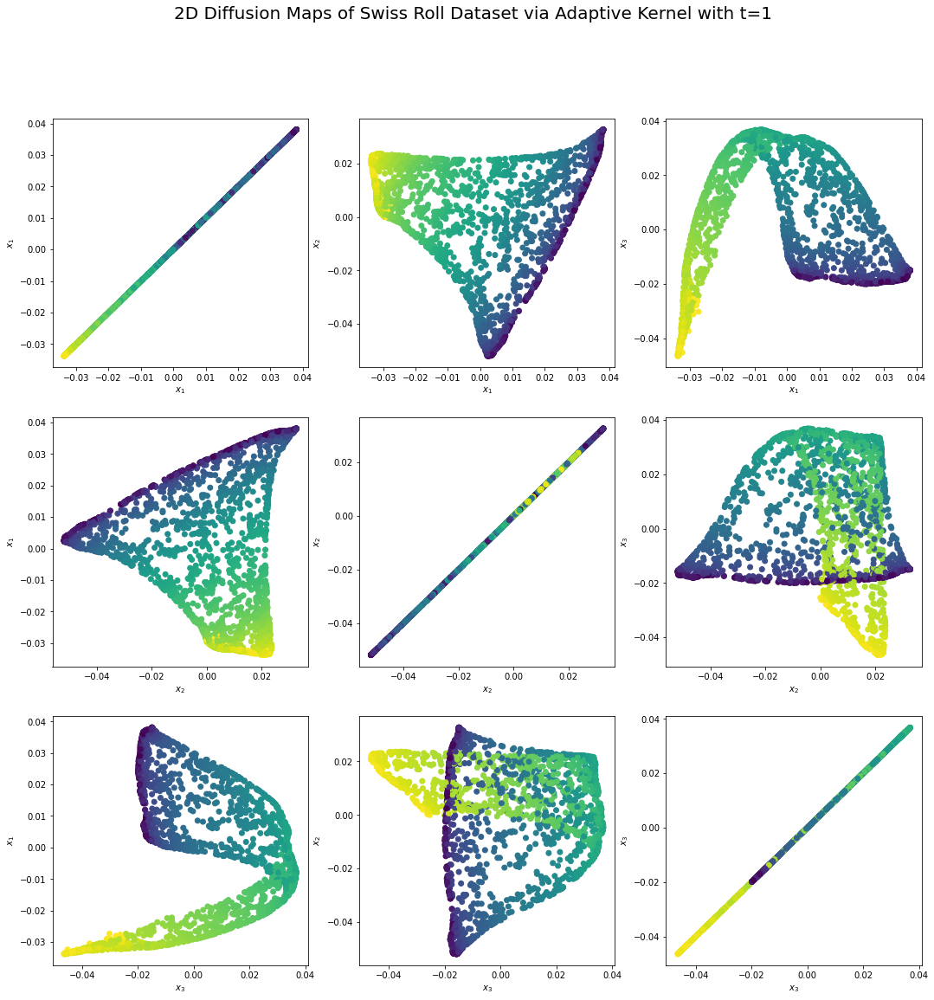

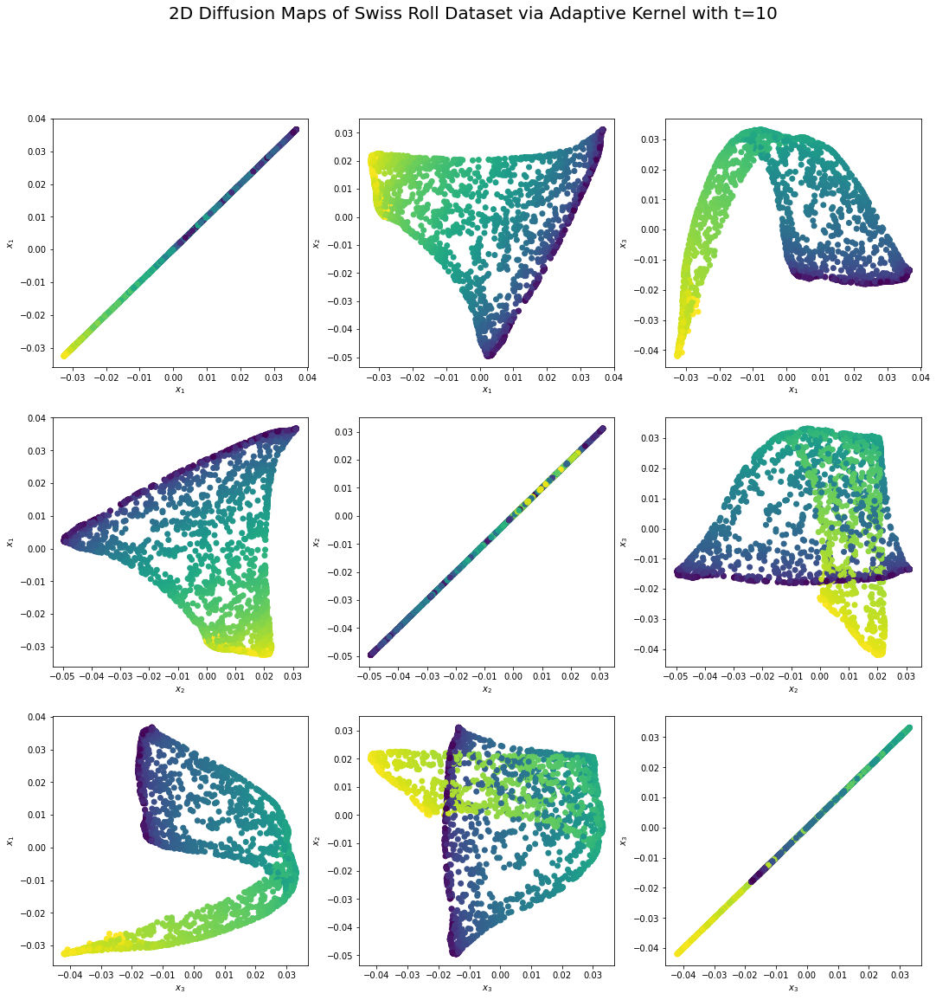

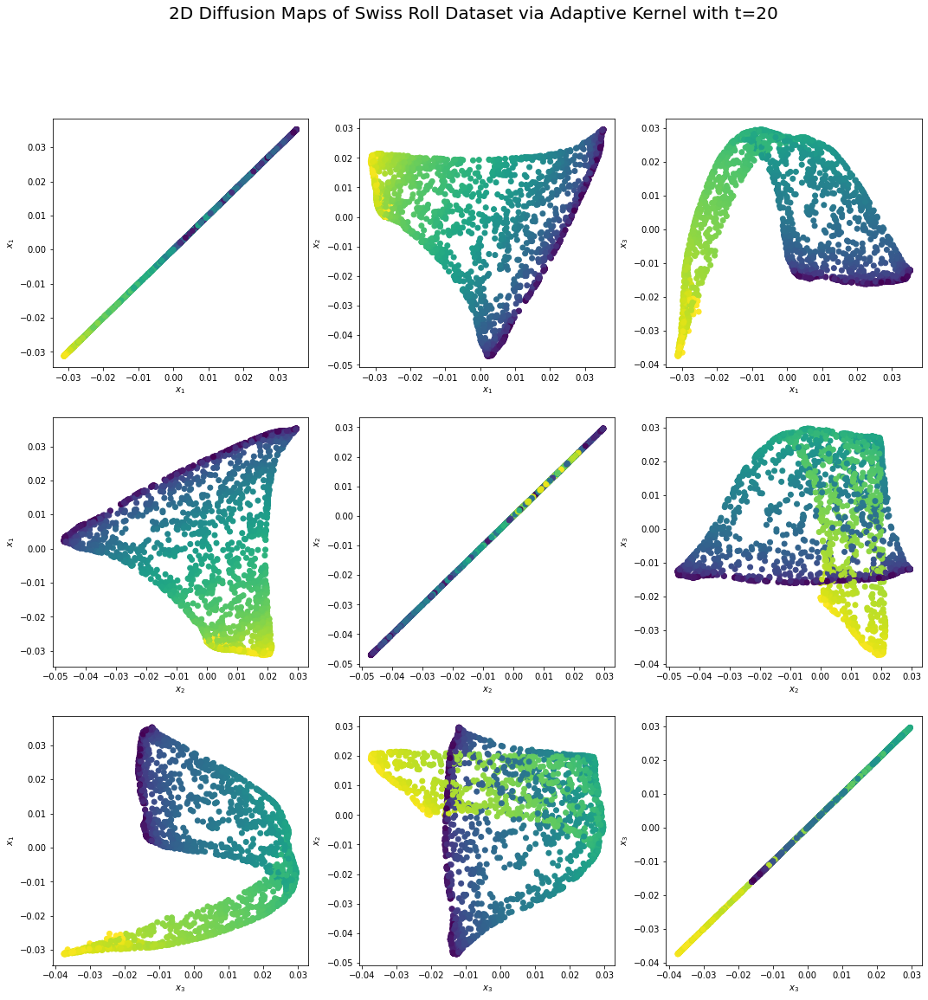

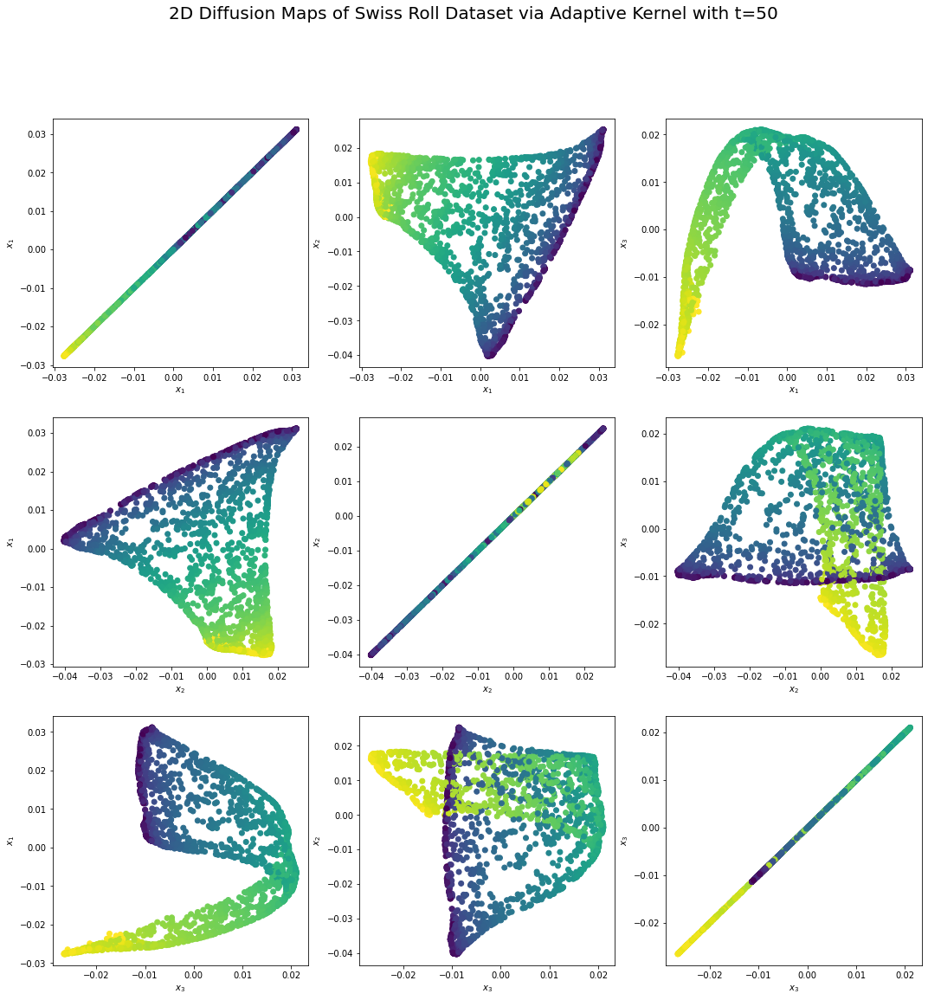

In [ ]:
for i,t in enumerate(ts):
    
    fig, axes = plt.subplots(3,3,  figsize=(18,18))
    plt.suptitle(f"2D Diffusion Maps of Swiss Roll Dataset via Adaptive Kernel with t={t}", size=20)

    for j in range(3):
        for k in range(3):                          
            axes[j,k].scatter(x=adap_diff_maps[i][:,j],
                              y=adap_diff_maps[i][:,k], 
                              c=swiss_labels)
            axes[j,k].set_xlabel(f'$x_{j+1}$',size=10)
            axes[j,k].set_ylabel(f'$x_{k+1}$', size=10) 
            
    # fig.savefig("swissroll_diffmap_adap_t{t}.png")

Text(0.5, 1.0, 'Eigenvalues of Markov Matrix via Adaptive Kernel $k=10$')

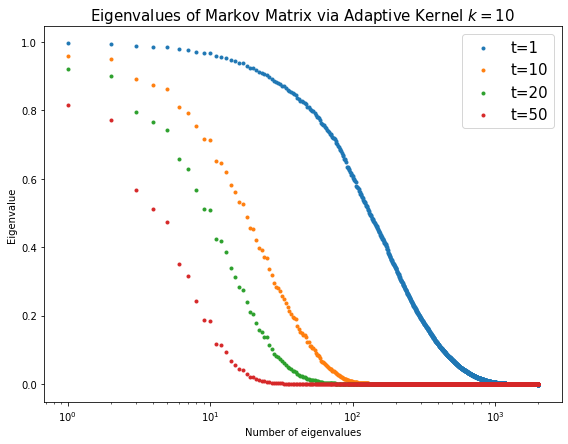

In [ ]:
fig, axes = plt.subplots(figsize=(8,6))

for i, t in enumerate(ts):
    axes.scatter(x=range(len(adap_diff_eig)+1)[1:], 
                y=adap_diff_eig**t,
                marker='.',
                label=f"t={t}") 

axes.set_xlabel('Number of eigenvalues')

axes.set_ylabel('Eigenvalue')

plt.legend(loc='upper right', fontsize=15)

plt.semilogx()

plt.tight_layout()

plt.title("Eigenvalues of Markov Matrix via Adaptive Kernel $k=10$", size=15)

# fig.savefig("swissroll_diffmap_adap_change_t_eigenvalues.png")

## Q 5.3

- in terms of diffusion processes, what's interpretation of increasing $t$?

    $t$ is the number of random diffusion steps, as $t$ increases, the diffusion area of will increase
    random walk will be around focus in a specific area and restrict more embedding mapping of the observations.


- How do diffusion embeddings visually change as $t$ increases?

    I don't see significant difference between embeddings of different $t$.


- How do eigenvalues change and how does this help explain what you see in embeddings?

    As $t$ increases, since eigenvalues are between 0 and 1, they decrease. 


- What can you learn about intrinsic dimensionality of dataset from eigenvalues of M as t increases?

    As $t$ increases, the number of significant eigenvalues decreases.


- Is there a specific value of t that you find most informative for Swiss roll dataset?

    $t=50$ is most informative since there is one significant eigenvalue (first eigenvalue).

## final thoughts

## Q 5.4

- describe 2 other datasets that you may generate to test the diffusion mappings


- what you expect to see from these tests

- dataset 1: a dataset in high-dimensionality with multiple clusters


- dataset 2: a dataset in 3D with a sphere shape

# iPSC Reprogramming dataset

- iPSC dataset is a mass cytometry dataset

    shows cellular reprogramming from mouse embryonic fibroblasts (MEFs) to **induced pluripotent stem cells** (iPSC) 诱导多能干细胞
    
    via intro of a transcription factor known as Oct4.
    

- the dataset measures 33 proteins at single-cell resolution


- protein markers measure

    1. pluripotency or stem-ness, e.g., sox4, oct 4 多能性或干细胞性
    
    2. differentiation: e.g. nanog and lin28 which are embryonic stem cell (ESC) markers
    
    3. cell-cycle: e.g., pRB which is a cell proliferation marker
    
    4. signaling status: e.g. pakt which is a growth inducing signal and p53 which signals DNA damage and could induce cell cycle arrest 细胞周期停滞. 
    
    The "p" preceding some of these markers indicates that measurement is for **phosphorylated** (usually active) conformation of the protein 蛋白质的磷酸化构象
    
    5. apoptosis: e.g. ccasp3 which is a caspase marker 半胱氨酸蛋白酶 involved in programmed cell death
    
    6. timepoint: day after stimulation with reprogramming factors that the measurement was taken from. 
    
    Here you have a mix of timepoints.
    
    These are low-granularity time points (on the order of days), while actual transition is much finergrained. 
    
    These protein markers enable measurement of reprogramming status. 
    
    e.g., a subset of cells shows evidence of being early reprogramming intermediates (interacts) with "correct" set of reprogramming factors Sox2+Oct4+Klf4+Nanog+,
    
    another subset seems successfully reprogrammed with ESC-like lineages expressing markers such as Nanog, Oct4, Lin28, Ssea1 and Epcam that are associated with transition to pluripotency.

- dataset: `ipsc_data_set.json`

    contains 2005 data points, many pre-processing steps have already done.

    each data point is protein expression condition samples at a particular time point


- `channel_names.json`: features:  33 protein markers

    "ipsc_channel_names.json": feature name, e.g., 'pplk1', 'h3k9ac', all names are in
    
- `timepoint` column: simply row number, e.g. 1st timepoint is row 1, 2nd timepoint is row 2,...

In [32]:
leadstring = '/Users/wenxinxu/Desktop/CPSC553/data/ipsc/'
ipsc_features = load_json_files(leadstring+"ipsc_data.json")
feature_names = load_json_files(leadstring+"ipsc_channel_names.json")
timepoint = range(ipsc_features.shape[0])
# center features mean 0
ipsc_features -= np.mean(ipsc_features, axis=0)

In [ ]:
print("iPSC featrues shape:", ipsc_features.shape)

iPSC featrues shape: (2005, 33)


In [ ]:
# print first 5 samples and first 5 features
ipsc_features[:5,:5] 

array([[ 4.0177e-01,  2.8458e+00, -3.9222e-04,  6.3590e-01, -2.8327e-02],
       [ 4.2336e+00,  4.3153e+00,  1.4833e+00,  1.7154e+00,  5.0164e+00],
       [ 6.4781e+00,  4.5025e+00,  2.7444e+00,  1.6928e+00,  2.8760e+00],
       [ 3.9153e+00,  3.9795e+00,  1.6496e+00,  1.6580e+00,  1.9919e+00],
       [ 4.7043e+00,  3.4433e+00,  2.8713e+00,  6.7796e-01,  1.1315e+00]])

In [36]:
feature_names

['pplk1',
 'h3k9ac',
 'h4kac',
 'ccasp3',
 'cd54',
 'pstat3-705',
 'thy1',
 'pampk',
 'cd24',
 'c-myc',
 'cd73',
 'ps6',
 'oct4',
 'perk',
 'ki67',
 'pstat3-727',
 'psrc',
 'ox',
 'nanog',
 'prb',
 'pakt',
 'sox2',
 'gfp',
 'ssea1',
 'ikba',
 'lin28',
 'cd140a',
 'epcam',
 'bcatenin',
 'cd44',
 'mefsk4',
 'klf4',
 'p53']

## visualize data with PCA

1. Run PCA on processed iPSC dataset, obtain principal components (PC), projections, singular values

In [ ]:
# SVD of data
u, s, vt = np.linalg.svd(ipsc_features.T, full_matrices=False)

# v are principal components with shape (2005, 33)
v = vt.T
print("Principal components:\nshape:", v.shape, "\nValue:\n",v)

print("\n") 

# projections      shape: (33, 33)
projections = u@ np.diag(s) 
print("Projections:\nshape:", projections.shape, "\nvalue:\n", projections)

print("\n") 

# s are singular values    number: 33
print("Singular values:\nnumber:", len(s), "\nvalue:\n", s) 

Principal components:
shape: (2005, 33) 
Value:
 [[ 3.66284018e-02 -4.60637956e-02  1.55770037e-02 ... -2.34405102e-02
  -1.32737348e-03 -3.20362730e-03]
 [ 9.63523167e-03  4.44370753e-02 -7.02414636e-03 ... -2.01151586e-02
   1.87642018e-02  2.40284273e-02]
 [-1.40821411e-02  3.96531616e-02 -1.85452074e-03 ...  1.05492368e-02
   2.68726995e-03  5.89927653e-03]
 ...
 [ 5.35174823e-02 -3.44950858e-02  1.02284773e-02 ... -9.61146818e-03
   9.76390236e-03 -2.32166286e-02]
 [-6.43914654e-03 -3.22120729e-03  3.72198705e-02 ... -2.46726045e-02
   2.80375549e-02 -1.79959574e-02]
 [-7.21205615e-04  1.52367877e-02  5.30278951e-02 ... -1.37827962e-02
  -5.08968635e-05  4.28782391e-03]]


Projections:
shape: (33, 33) 
value:
 [[-3.47656757e+01  3.52995807e+01 -2.74929444e+00 ...  1.44209204e+01
   9.86727956e-01 -7.39080958e-01]
 [-5.78769943e+01  2.13784811e+01  1.81774436e+01 ... -1.03097549e+01
   2.11501482e-01 -6.04168513e-02]
 [-1.59761419e+01  1.15005928e+01  5.62618501e-01 ...  6.11704643

2. Plot iPSC dataset in 2D using PC, colored by time steps

    You may try a few combinations of top $k=5$ PC.


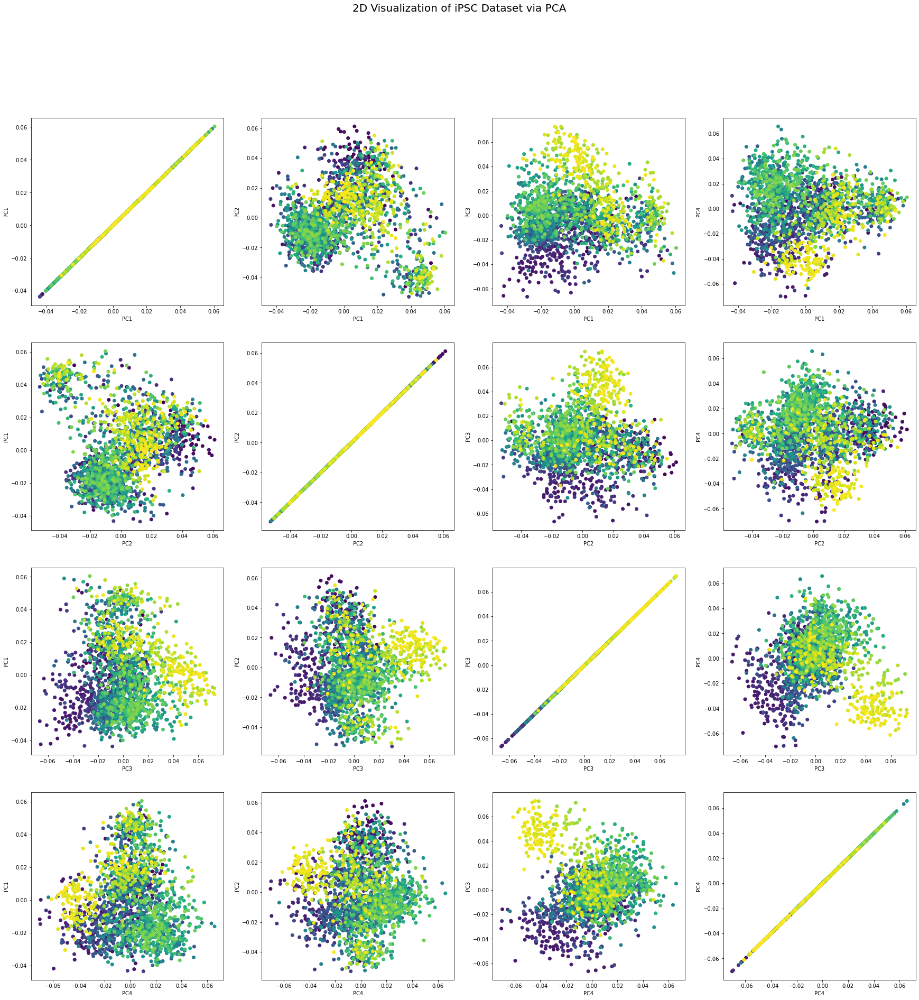

In [ ]:
fig, axes = plt.subplots(4,4,  figsize=(30,30))

plt.suptitle("2D Visualization of iPSC Dataset via PCA", size=20)

for i in range(4):
    for j in range(4):
        axes[i,j].scatter(x=v[:,i],
                   y=v[:,j],  
                   c=timepoint)
        axes[i,j].set_xlabel(f'PC{i+1}',size=10)
        axes[i,j].set_ylabel(f'PC{j+1}', size=10)  


# fig.savefig("ipsc_PCA_2D.png")

3. Plot singular values in your preferred way

Text(0, 0.5, 'Explained Variance')

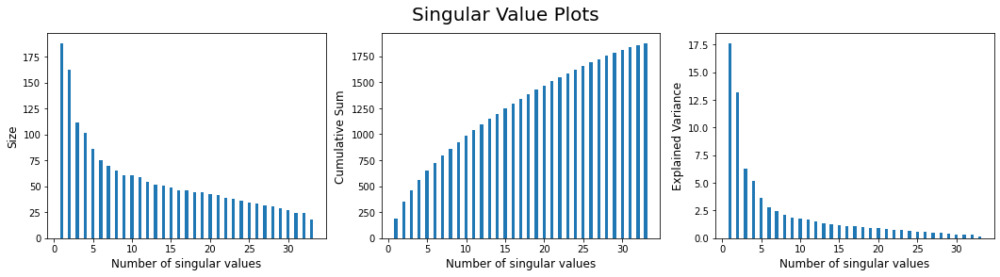

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(18,4))

plt.suptitle("Singular Value Plots", size=20)

axes[0].bar(range(len(s)+1)[1:], s,  width = 0.4)
axes[0].set_xlabel('Number of singular values', size=12)
axes[0].set_ylabel('Size', size=12)

axes[1].bar(range(len(s)+1)[1:], np.cumsum(s), width = 0.4)
axes[1].set_xlabel('Number of singular values', size=12)
axes[1].set_ylabel("Cumulative Sum", size=12)


axes[2].bar(range(len(s)+1)[1:], (s**2)/(ipsc_features.shape[0]-1), width = 0.4)
axes[2].set_xlabel('Number of singular values', size=12)
axes[2].set_ylabel('Explained Variance', size=12)


# fig.savefig("ipsc_PCA_singularvalue.png")

## Q 6.1

- How do PCA visualizations look?

    - Are they capturing time progression of dataset?

    - Do you see any clusters forming?

    All the plots form several clusters of 4 different colors: yellow, light green, dark green and purple. So to some extent, PCA captures time progression of dataset. But I can't clearly distinguish between them because they have overlap.


- What is intrinsic dimensionality given by PCA?

    From the 1st plot (size) and 3rd plot (explained variance) of singular values, we can see there are 2 significant singular values, so the intrinsic dimensionality is 2.


- What are top few channels in first and second principal directions?

    meaning: what are the top 5 proteins who first expressed during cell reprogramming?
    
    PC1: 'oct4', 'ki67', 'klf4', 'h3k9ac', 'prb'
    
    PC2: 'bcatenin', 'ikba', 'thy1', 'ps6', 'pstat3-727'

In [ ]:
print("Top 5 channels in 1st principal direction:\n",[feature_names[i] for i in abs(projections[:,0]).argsort()[::-1][:5]])

print("Top 5 channels in 2nd principal direction:\n",[feature_names[i] for i in abs(projections[:,1]).argsort()[::-1][:5]])

Top 5 channels in 1st principal direction:
 ['oct4', 'ki67', 'klf4', 'h3k9ac', 'prb']
Top 5 channels in 2nd principal direction:
 ['bcatenin', 'ikba', 'thy1', 'ps6', 'pstat3-727']


## visualize data with diffusion maps

1. Construct affinity matrix of iPSC data set using Euclidean distance and adaptive KNN Gaussian kernel with k = 2 and diffusion parameter t = 1.


2. Create 2D scatter plots of diffusion mapping using different coordinates.


3. Create 3D scatter plot of diffusion mapping using 1st 3 coordinates for plotting. Color the points with their corresponding timepoint values.


4. Plot eigenvalues of Markov matrix.


5. Compute top 5 channels that have **highest absolute correlation** with 1st, 2nd, 3rd diffusion components.

## change params

### change k

1. Construct affinity matrix of iPSC data set using Euclidean distance and adaptive KNN Gaussian kernel with k = 2 and diffusion parameter t = 1.

In [ ]:
# change k
adap_diff_maps = [0, 0, 0] 
adap_diff_vecs = [0, 0, 0] 
adap_diff_eigs = [0, 0, 0]  

ks = [2, 5, 10]
for i, k in enumerate(ks):
    adap_diff_maps[i], adap_diff_vecs[i], adap_diff_eigs[i] = diff_map(ipsc_features, "adaptive", 1, sigma=None, k=k)


100%|██████████| 2005/2005 [08:33<00:00,  3.91it/s]


2. Create 2D scatter plots of diffusion mapping using different coordinates.

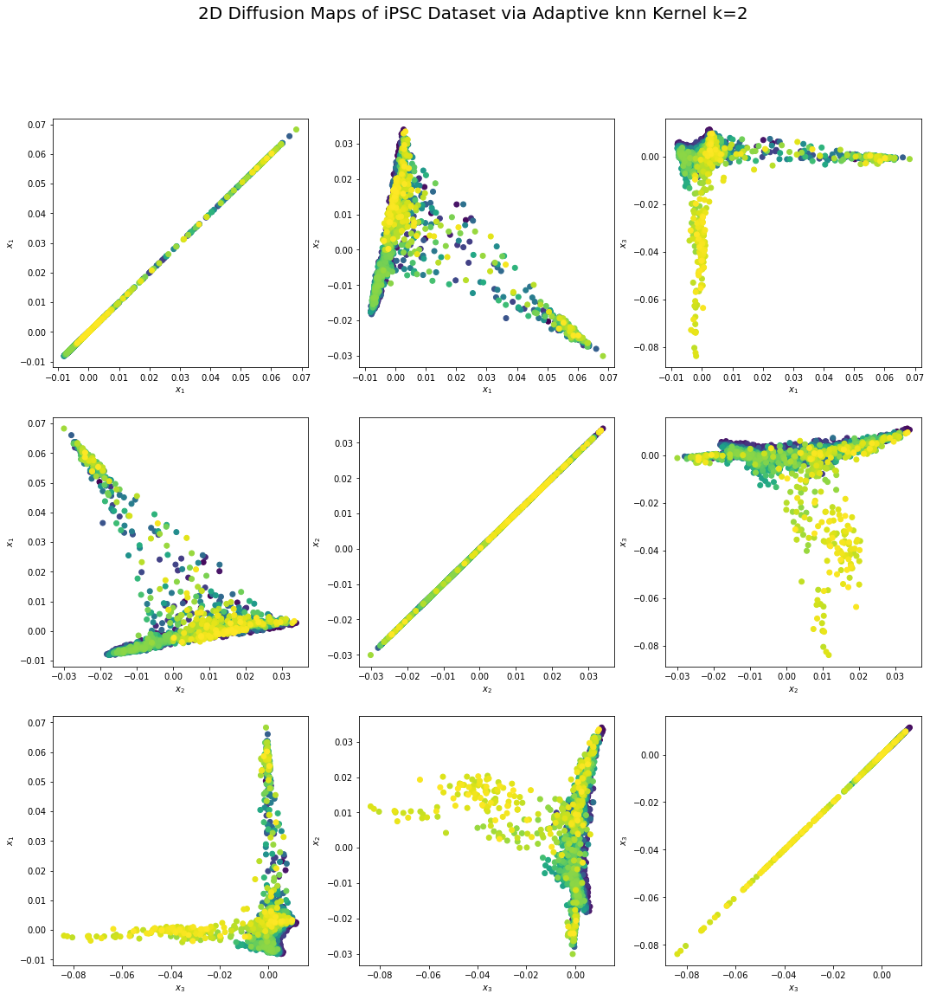

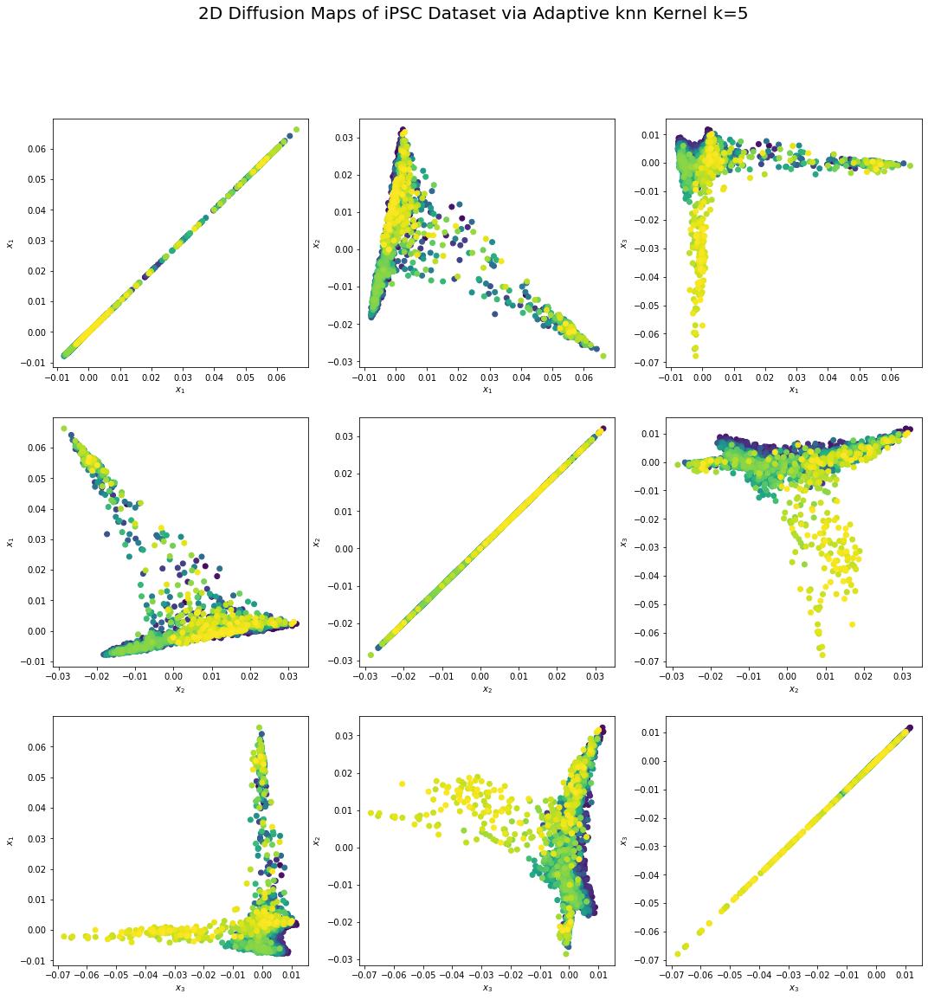

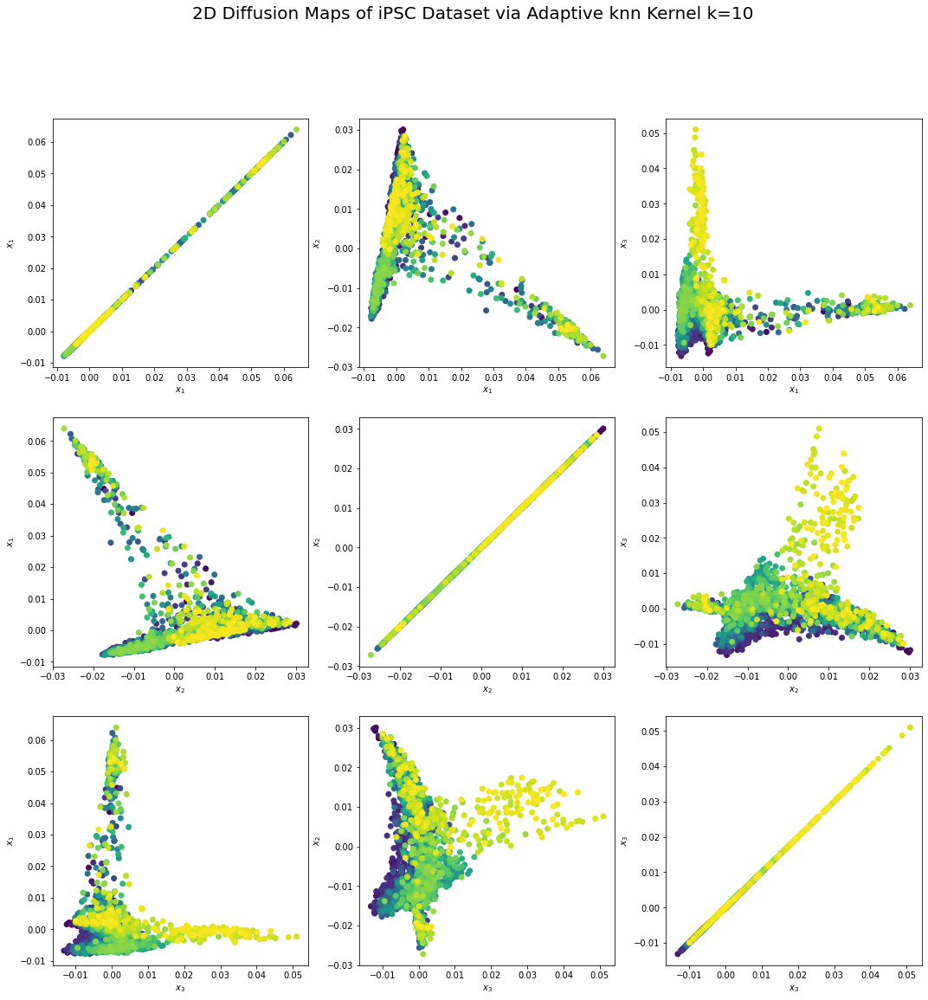

In [ ]:
for i,k in enumerate(ks):
    fig, axes = plt.subplots(3,3,  figsize=(18,18))
    plt.suptitle(f"2D Diffusion Maps of iPSC Dataset via Adaptive knn Kernel k={k}", size=20)

    for j in range(3):
        for q in range(3):  
                        
            axes[j,q].scatter(x=adap_diff_maps[i][:,j],
                              y=adap_diff_maps[i][:,q], 
                              c=timepoint)
            axes[j,q].set_xlabel(f'$x_{j+1}$',size=10)
            axes[j,q].set_ylabel(f'$x_{q+1}$', size=10) 
            
    # fig.savefig("ipsc_diffmap_adap_k{k}_2d.png")

3. Create 3D scatter plot of diffusion mapping using 1st 3 coordinates for plotting. Color the points with their corresponding timepoint values.

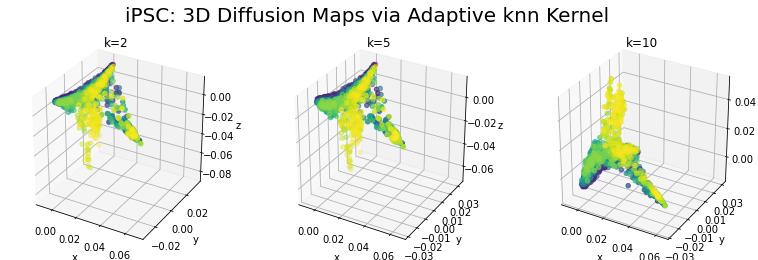

In [ ]:
# 3D visualizing data using a scatter plot colored by timestep
# features are x, y, z coordinates

# set up a figure with height:weight = 0.3
fig = plt.figure(figsize=plt.figaspect(0.3))
plt.suptitle(f"iPSC: 3D Diffusion Maps via Adaptive knn Kernel", size=20)

for i, k in enumerate(ks):
  axes = fig.add_subplot(1,3, i+1, projection = '3d')
  x, y, z = adap_diff_maps[i][:,0], adap_diff_maps[i][:,1], adap_diff_maps[i][:,2]      
  axes.scatter(x,y,z, c=timepoint)
  axes.set_xlabel("x") 
  axes.set_ylabel("y") 
  axes.set_zlabel("z") 
  axes.set_title(f"k={k}")

# fig.savefig("ipsc_diffmap_adpt_change_k_3D.png")

4. Plot eigenvalues of Markov matrix.

Text(0.5, 1.0, 'iPSC: Eigenvalues of Markov Matrix via Adaptive Kernel')

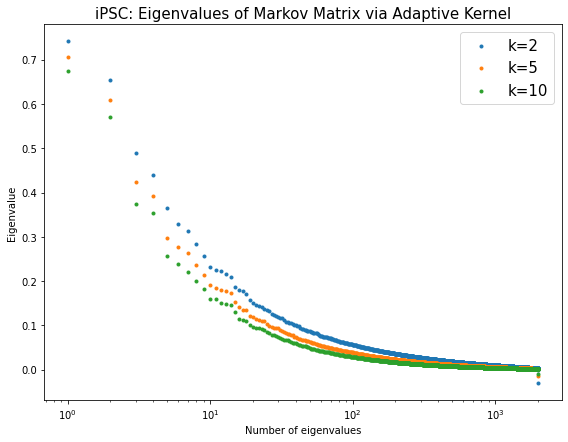

In [ ]:
fig, axes = plt.subplots(figsize=(8,6))

for i, k in enumerate(ks):
    axes.scatter(x=range(len(adap_diff_eigs[i])+1)[1:], 
                y=adap_diff_eigs[i],
                marker='.',
                label=f"k={k}") 

axes.set_xlabel('Number of eigenvalues')

axes.set_ylabel('Eigenvalue')

plt.legend(loc='upper right', fontsize=15)

plt.semilogx()

plt.tight_layout()

plt.title("iPSC: Eigenvalues of Markov Matrix via Adaptive Kernel", size=15)

# fig.savefig("ipsc_diffmap_adapt_change_k_eigenvalues.png")

5. Compute top 5 channels that have **highest absolute correlation** with 1st, 2nd, 3rd diffusion components.

In [ ]:
# create a nested list to score correlation matrix for first 3 diffusion components
# and different k

from scipy import stats

# create a nested list to store correlation value of 33 channels for first 3 diffusion components
# and different k
R = [[0 for i in range(3)] for j in range(len(ks))]

# create a nested list to store names of top5 channels for first 3 diffusion components
# and different k
top5channels = [[0 for i in range(3)] for j in range(len(ks))]

for i,k in enumerate(ks):  
    print(f"Given k={k}, Top 5 channels highest absolute correlation with")
    for j in range(3):
        # R[i][j] = np.corrcoef(ipsc_features, adap_diff_vecs[i][:,j], rowvar=False)

        R[i][j] = [scipy.stats.pearsonr(channel, adap_diff_vecs[i][:,j])[0] for channel in ipsc_features.T]

        top5channels[i][j] = [feature_names[q] for q in np.abs(R[i][j]).argsort()[::-1][:5]]
        
        print(f"NO.{j+1} diffusion components: {top5channels[i][j]}")
    
    print("\n")
    

Given k=2, Top 5 channels highest absolute correlation with
NO.1 diffusion components: ['h3k9ac', 'prb', 'pplk1', 'pstat3-727', 'pampk']
NO.2 diffusion components: ['bcatenin', 'cd140a', 'ikba', 'mefsk4', 'oct4']
NO.3 diffusion components: ['lin28', 'ssea1', 'epcam', 'cd44', 'gfp']


Given k=5, Top 5 channels highest absolute correlation with
NO.1 diffusion components: ['h3k9ac', 'prb', 'pplk1', 'pstat3-727', 'pampk']
NO.2 diffusion components: ['bcatenin', 'cd140a', 'ikba', 'mefsk4', 'oct4']
NO.3 diffusion components: ['lin28', 'epcam', 'ssea1', 'cd44', 'gfp']


Given k=10, Top 5 channels highest absolute correlation with
NO.1 diffusion components: ['h3k9ac', 'prb', 'pplk1', 'pstat3-727', 'pampk']
NO.2 diffusion components: ['bcatenin', 'cd140a', 'ikba', 'mefsk4', 'oct4']
NO.3 diffusion components: ['lin28', 'epcam', 'ssea1', 'sox2', 'thy1']




### change t 

1. Construct affinity matrix of iPSC data set using Euclidean distance and adaptive KNN Gaussian kernel with k = 2 and diffusion parameter t = 1, 10, 50.

In [ ]:
# compute distance matrix
D = compute_distances(ipsc_features)

# compute affinity matrix for k=2
W = compute_affinity_matrix(D, "adaptive", sigma=None, k=2)

# eigenvectors and eigenvalues of Markov Matrix
adap_diff_vec, adap_diff_eig = diff_map_info(W)

ts = [1, 10, 50] 

adap_diff_maps = [0 for i in range(len(ts))]

for i, t in enumerate(ts):

    adap_diff_maps[i] = get_diff_map(adap_diff_vec, adap_diff_eig, t) 

100%|██████████| 2005/2005 [08:34<00:00,  3.90it/s]


2. Create 2D scatter plots of diffusion mapping using different coordinates.

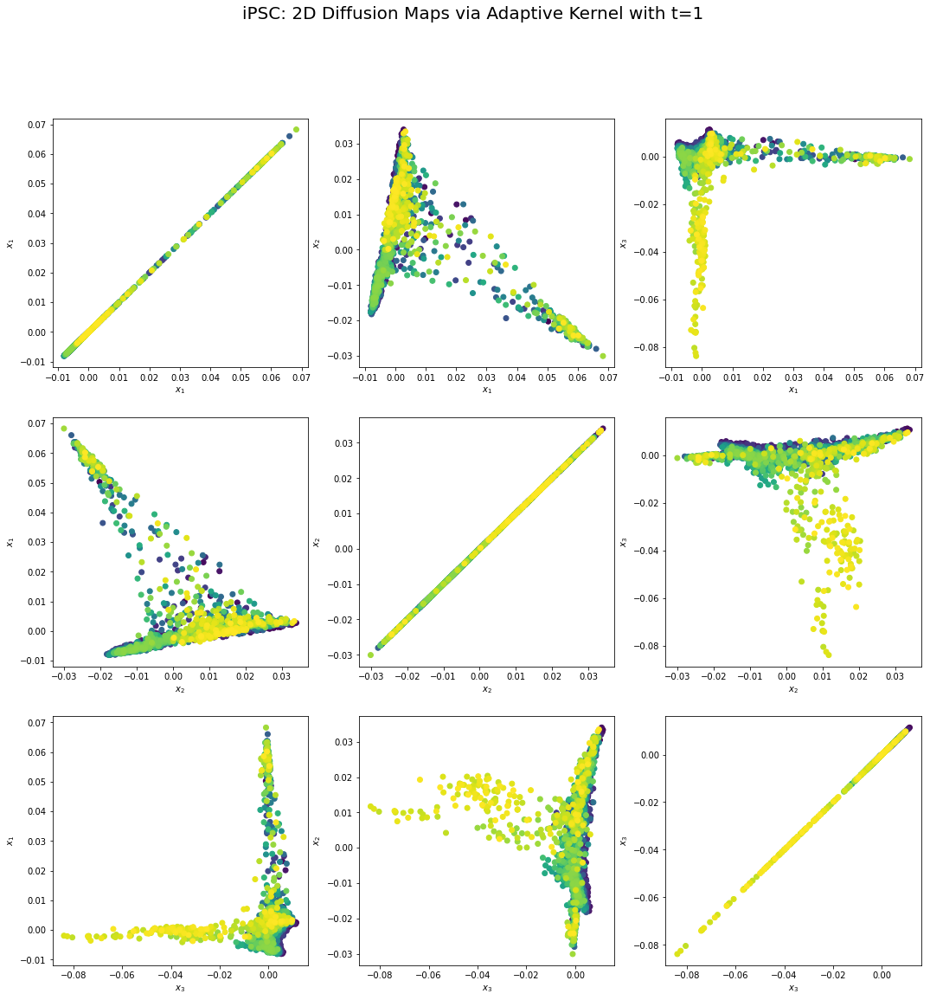

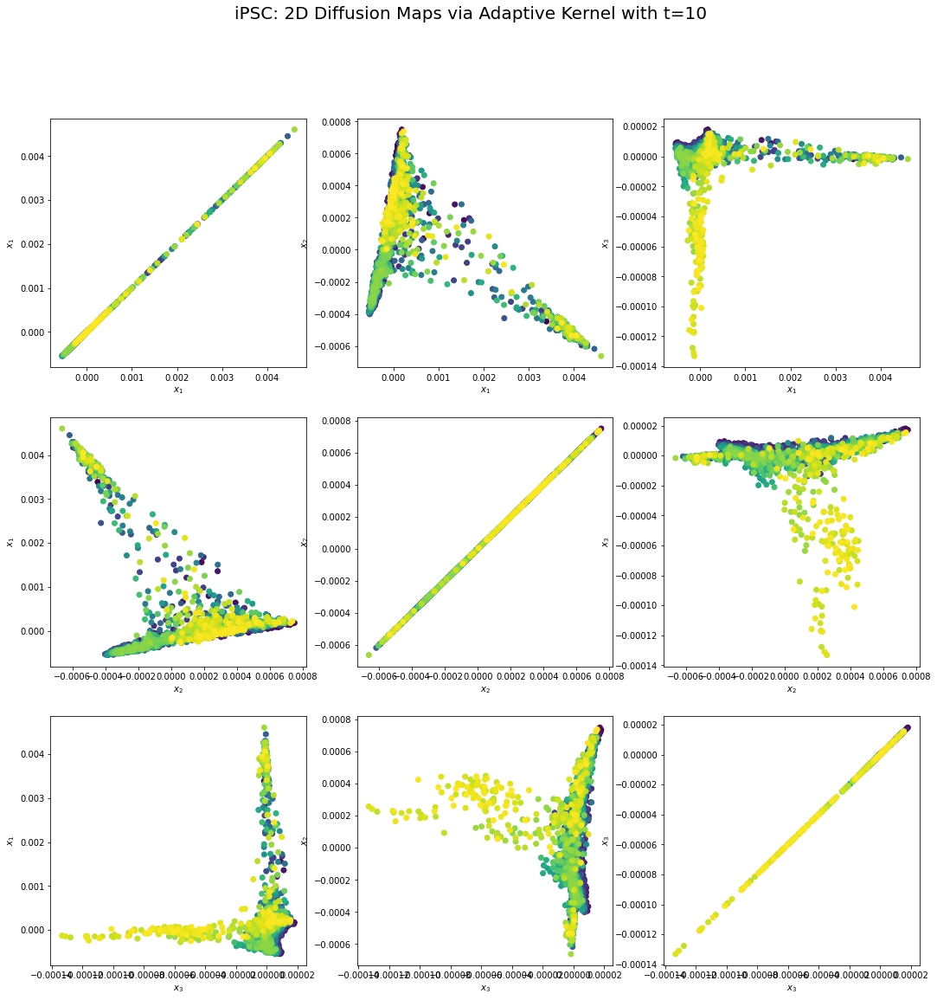

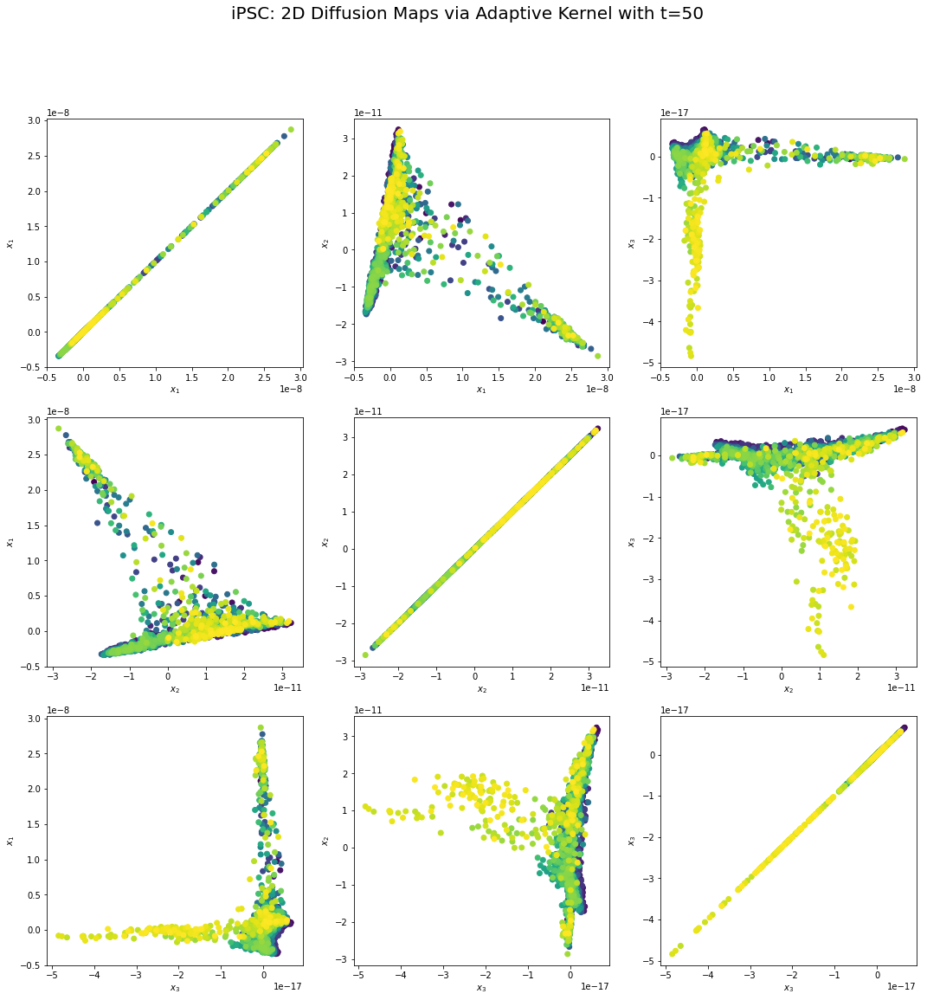

In [ ]:
for i in range(len(ts)):
    
    fig, axes = plt.subplots(3,3,  figsize=(18,18))
    plt.suptitle(f"iPSC: 2D Diffusion Maps via Adaptive Kernel with t={ts[i]}", size=20)

    for j in range(3):
        for k in range(3):                          
            axes[j,k].scatter(x=adap_diff_maps[i][:,j],
                              y=adap_diff_maps[i][:,k], 
                              c=timepoint)
            axes[j,k].set_xlabel(f'$x_{j+1}$',size=10)
            axes[j,k].set_ylabel(f'$x_{k+1}$', size=10) 
            
    # fig.savefig("ipsc_diffmap_adap_t{t}.png")

3. Create 3D scatter plot of diffusion mapping using 1st 3 coordinates for plotting. Color the points with their corresponding timepoint values.

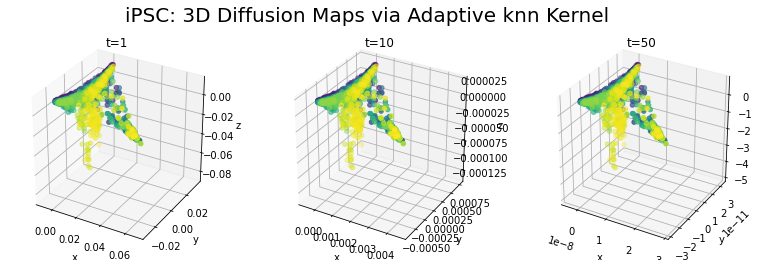

In [ ]:
# 3D visualizing data using a scatter plot colored by timestep
# features are x, y, z coordinates

# set up a figure with height:weight = 0.3
fig = plt.figure(figsize=plt.figaspect(0.3))

plt.suptitle(f"iPSC: 3D Diffusion Maps via Adaptive knn Kernel", size=20)

for i,t in enumerate(ts):

  axes = fig.add_subplot(1,3, i+1, projection = '3d')

  x, y, z = adap_diff_maps[i][:,0], adap_diff_maps[i][:,1], adap_diff_maps[i][:,2]
        
  axes.scatter(x,y,z, c=timepoint)
        
  axes.set_xlabel("x") 

  axes.set_ylabel("y") 

  axes.set_zlabel("z") 
        
  axes.set_title(f"t={t}")


# fig.savefig("ipsc_diffmap_adpt_change_t_3D.png")

4. Plot eigenvalues of Markov matrix.

Text(0.5, 1.0, 'iPSC: Eigenvalues of Markov Matrix via Adaptive Kernel $k=2$')

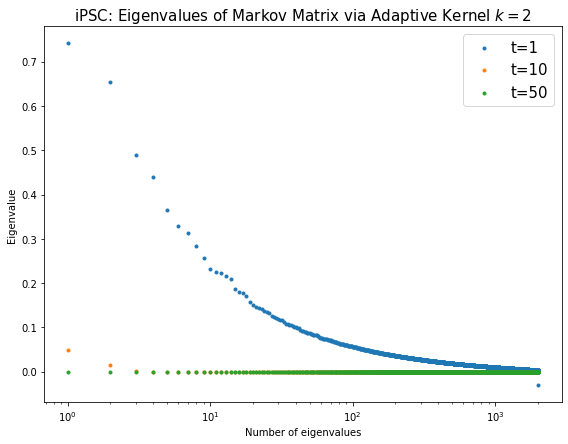

In [ ]:
fig, axes = plt.subplots(figsize=(8,6))

for i,t in enumerate(ts):
    axes.scatter(x=range(len(adap_diff_eig)+1)[1:], 
                y=adap_diff_eig**t,
                marker='.',
                label=f"t={t}") 

axes.set_xlabel('Number of eigenvalues')

axes.set_ylabel('Eigenvalue')

plt.legend(loc='upper right', fontsize=15)

plt.semilogx()

plt.tight_layout()

plt.title("iPSC: Eigenvalues of Markov Matrix via Adaptive Kernel $k=2$", size=15)

# fig.savefig("ipsc_diffmap_adap_change_t_eigenvalues.png")

5. Compute top 5 channels that have **highest absolute correlation** with 1st, 2nd, 3rd diffusion components.

In [ ]:
# create a nested list to score correlation matrix for first 3 diffusion components
# and different t

from scipy import stats

# create a nested list to store correlation value of 33 channels for first 3 diffusion components
# and different t
R = [[0 for i in range(3)] for j in range(len(ts))]

# create a nested list to store names of top5 channels for first 3 diffusion components
# and different k
top5channels = [[0 for i in range(3)] for j in range(len(ts))]

for i, t in enumerate(ts):  
    print(f"Given t={t}, Top 5 channels highest absolute correlation with")
    for j in range(3):

        R[i][j] = [scipy.stats.pearsonr(channel, adap_diff_vecs[i][:,j])[0] for channel in ipsc_features.T]

        top5channels[i][j] = [feature_names[q] for q in np.abs(R[i][j]).argsort()[::-1][:5]]
        
        print(f"NO.{j+1} diffusion components: {top5channels[i][j]}")
    
    print("\n")
    

Given t=1, Top 5 channels highest absolute correlation with
NO.1 diffusion components: ['h3k9ac', 'prb', 'pplk1', 'pstat3-727', 'pampk']
NO.2 diffusion components: ['bcatenin', 'cd140a', 'ikba', 'mefsk4', 'oct4']
NO.3 diffusion components: ['lin28', 'ssea1', 'epcam', 'cd44', 'gfp']


Given t=10, Top 5 channels highest absolute correlation with
NO.1 diffusion components: ['h3k9ac', 'prb', 'pplk1', 'pstat3-727', 'pampk']
NO.2 diffusion components: ['bcatenin', 'cd140a', 'ikba', 'mefsk4', 'oct4']
NO.3 diffusion components: ['lin28', 'epcam', 'ssea1', 'cd44', 'gfp']


Given t=50, Top 5 channels highest absolute correlation with
NO.1 diffusion components: ['h3k9ac', 'prb', 'pplk1', 'pstat3-727', 'pampk']
NO.2 diffusion components: ['bcatenin', 'cd140a', 'ikba', 'mefsk4', 'oct4']
NO.3 diffusion components: ['lin28', 'epcam', 'ssea1', 'sox2', 'thy1']




## Q 6.3

- Did choice of t affect embeddings and how?


- Do corresponding eigenvalues support your finding?

My choice of $t$ is 1, 10, 50.

I don't see significant difference in 2D and 3D plots of embeddings.

In theory, as $t$ increases, eigenvalues will decrease, which is supported by the plot of eigenvalues.

- Did choice of k affect embeddings and how?

  My choice of $k$ is 2, 5, 10.

  When $k=2$ and $k=5$, the 2D plots or 3D plots of embeddings are very similar. But when $k=10$, both 2D plots and 3D plots of embeddings are different from former. 

  For 2D plot, it differs in terms of
$x_1$ VS. $x_3$ and $x_2$ VS. $x_3$.

  For 3D plot, it is turned upside down and occurs in bottom of plot.


- Did previously observed trends (clusters, time progression) in diffusion dimensions change dramatically?

  The previously observed trends aren't change dramativally.


- Did correlated channels change with $\sigma$? How would you interpret this in terms of the data?

  With different combinations of hyperparameters $t$ and $k$, the correlated channels don't change too much with adaptive $\sigma$.

  1st diffusion components: ['h3k9ac', 'prb', 'pplk1', 'pstat3-727', 'pampk'] (same)

  2nd diffusion components: ['bcatenin', 'cd140a', 'ikba', 'mefsk4', 'oct4'] (same)

  3rd diffusion components: ['lin28', 'ssea1', 'epcam', 'cd44', 'gfp'] or ['lin28', 'ssea1', 'epcam', 'sox2', 'thy1']


  This indivates these proteins ['h3k9ac', 'prb', 'pplk1', 'pstat3-727', 'pampk'] may interact much with each other and play an important role during cell reprogramming


In [ ]:
# change t

Given t=1, Top 5 channels highest absolute correlation with
NO.1 diffusion components: ['h3k9ac', 'prb', 'pplk1', 'pstat3-727', 'pampk']
NO.2 diffusion components: ['bcatenin', 'cd140a', 'ikba', 'mefsk4', 'oct4']
NO.3 diffusion components: ['lin28', 'ssea1', 'epcam', 'cd44', 'gfp']


Given t=10, Top 5 channels highest absolute correlation with
NO.1 diffusion components: ['h3k9ac', 'prb', 'pplk1', 'pstat3-727', 'pampk']
NO.2 diffusion components: ['bcatenin', 'cd140a', 'ikba', 'mefsk4', 'oct4']
NO.3 diffusion components: ['lin28', 'epcam', 'ssea1', 'cd44', 'gfp']


Given t=50, Top 5 channels highest absolute correlation with
NO.1 diffusion components: ['h3k9ac', 'prb', 'pplk1', 'pstat3-727', 'pampk']
NO.2 diffusion components: ['bcatenin', 'cd140a', 'ikba', 'mefsk4', 'oct4']
NO.3 diffusion components: ['lin28', 'epcam', 'ssea1', 'sox2', 'thy1']


# change k
Given k=2, Top 5 channels highest absolute correlation with
NO.1 diffusion components: ['h3k9ac', 'prb', 'pplk1', 'pstat3-727', 'pampk']
NO.2 diffusion components: ['bcatenin', 'cd140a', 'ikba', 'mefsk4', 'oct4']
NO.3 diffusion components: ['lin28', 'ssea1', 'epcam', 'cd44', 'gfp']


Given k=5, Top 5 channels highest absolute correlation with
NO.1 diffusion components: ['h3k9ac', 'prb', 'pplk1', 'pstat3-727', 'pampk']
NO.2 diffusion components: ['bcatenin', 'cd140a', 'ikba', 'mefsk4', 'oct4']
NO.3 diffusion components: ['lin28', 'epcam', 'ssea1', 'cd44', 'gfp']


Given k=10, Top 5 channels highest absolute correlation with
NO.1 diffusion components: ['h3k9ac', 'prb', 'pplk1', 'pstat3-727', 'pampk']
NO.2 diffusion components: ['bcatenin', 'cd140a', 'ikba', 'mefsk4', 'oct4']
NO.3 diffusion components: ['lin28', 'epcam', 'ssea1', 'sox2', 'thy1']
